# Notebook 3; Reproducible results:

This notebook contains the scripts that generate all figures provided in our manuscript.


## Preliminary scripts

---

These scripts load required packages and define useful functions that are used by this notebook.

##### Package imports

---


In [ ]:
import os
import gc
import sys
import glob
import json
import random
import datetime
import importlib
import itertools
import numpy as np
from scipy import spatial
import scipy.sparse as sparse
import scipy.stats as stats
import scipy.io as sio
import pandas as pd
import nibabel as nib
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sns
import boto3
import lapy
import h5py
from sklearn import linear_model
from tqdm.notebook import tqdm

# CSS used for computing local distances and connectome smoothing
from Connectome_Spatial_Smoothing import CSS as css

# Cerebro brain viewer used for visualization
from cerebro import cerebro_brain_utils as cbu
from cerebro import cerebro_brain_viewer as cbv


##### Basic functions

---


In [2]:
# Some useful functions

class MyNumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        else:
            return super(MyEncoder, self).default(obj)


def ensure_dir(file_name):
    os.makedirs(os.path.dirname(file_name), exist_ok=True)
    return file_name


def list_dirs(path=os.getcwd()):
    files = glob.glob(os.path.join(path, '*'))
    files = [x for x in files if os.path.isdir(x)]
    return files


def file_exists(file_name, path_name=os.getcwd()):
    return os.path.isfile(os.path.join(path_name, file_name))


def write_json(json_obj, file_path):
    with open(file_path, 'w') as outfile:
        json.dump(json_obj, outfile, sort_keys=True, indent=4,
                  cls=MyNumpyEncoder)
    return json_obj


def load_json(file_path):
    with open(file_path, 'r') as infile:
        return json.load(infile)


def write_np(np_obj, file_path):
    with open(file_path, 'wb') as outfile:
        np.save(outfile, np_obj)


def load_np(file_path):
    with open(file_path, 'rb') as infile:
        return np.load(infile)


##### Visualization functions

---

[Cerebro brain viewer](https://github.com/sina-mansour/Cerebro_Viewer) was used for visualization.


In [36]:
# Brain visualizations with Cerebro

# ignore warning when loading cifti
nib.imageglobals.logger.setLevel(40)

def plot_left_surface_with_cerebro(dscalar_data, ax, colormap=plt.cm.coolwarm, clims=None, vlims=None, exclusion_color=(0.5,0.5,0.5,1), view="L", show_colorbar=False, colorbar_format=None):
    try:
        my_brain_viewer = cbv.Cerebro_brain_viewer(offscreen=True, background_color=(1,1,1,0), null_color=(0.9, 0.9, 0.9, 0.0), no_color=(.6, .6, .6, 1.))

        surface = 'midthickness'
        surface_model = my_brain_viewer.load_template_GIFTI_cortical_surface_models(surface)

        cifti_space = my_brain_viewer.visualize_cifti_space(
            volumetric_structures='none',
        )

        dscalar_layer = my_brain_viewer.add_cifti_dscalar_layer(
            dscalar_data=dscalar_data,
            colormap=colormap,
            clims=clims,
            vlims=vlims,
            exclusion_color=exclusion_color,
            opacity=0.95)

        ax.axis('off')
        camconf = my_brain_viewer.view_to_camera_config(view)
        camconf = my_brain_viewer.zoom_camera_to_content(camconf)
        my_brain_viewer.viewer.change_view(**camconf)
        my_brain_viewer.offscreen_draw_to_matplotlib_axes(ax)

        if show_colorbar:
            cax = inset_axes(
                ax,
                width="50%",
                height="4%",
                loc="lower center",
                bbox_to_anchor=(-0., 0.0, 1., 1.),
                bbox_transform=ax.transAxes,
                borderpad=0,
            )
            cb = fig.colorbar(
                mpl.cm.ScalarMappable(
                    norm=mpl.colors.Normalize(vmin=clims[0], vmax=clims[1]),
                    cmap=colormap
                ),
                cax=cax,
                aspect=10,
                orientation='horizontal',
                format=colorbar_format,
            )
            cb.outline.set_visible(False)
            cb.ax.tick_params(labelsize=12)
            cb.ax.tick_params(length=0)

    finally:
        my_brain_viewer.viewer.window.destroy()


##### Directory structure

---


In [4]:
# path setting
main_dir = os.path.abspath('../')

data_dir = f"{main_dir}/data"


##### Permutation testing

---


In [5]:
# basic parameters
surface = 'midthickness_MSMAll'

# load an example dscalar
dscalar_file = f'{data_dir}/templates/ones.dscalar.nii'
dscalar = nib.load(dscalar_file)

brain_models = [x for x in dscalar.header.get_index_map(1).brain_models]

# load surfaces for visualization
left_surface_file = f'{data_dir}/templates/S1200.L.{surface}.32k_fs_LR.surf.gii'
left_surface = nib.load(left_surface_file)
right_surface_file = f'{data_dir}/templates/S1200.R.{surface}.32k_fs_LR.surf.gii'
right_surface = nib.load(right_surface_file)

# create a mapping between surface and cifti vertices
left_cortical_surface_model, right_cortical_surface_model = brain_models[0], brain_models[1]
cifti_to_surface = {}
surface_to_cifti = {}
for (i, x) in enumerate(left_cortical_surface_model.vertex_indices):
    cifti_to_surface[i] = x
    surface_to_cifti[x] = i
for (i, x) in enumerate(right_cortical_surface_model.vertex_indices):
    cifti_to_surface[i + right_cortical_surface_model.index_offset] = x + right_surface.darrays[0].data.shape[0]
    surface_to_cifti[x + right_surface.darrays[0].data.shape[0]] = i + right_cortical_surface_model.index_offset

# construct data over surface
surface_mask = list(surface_to_cifti.keys())

left_surface_mask = surface_mask[:right_cortical_surface_model.index_offset]
right_surface_mask = surface_mask[right_cortical_surface_model.index_offset:]


In [6]:
# Spin-test for eigenmodes
left_sphere = nib.load("/mountpoint/data/GvC/S1200.L.sphere.32k_fs_LR.surf.gii")

# load coordingates of vertices on the sphere mesh
vertices = left_sphere.darrays[0].data

# load the coordinates to a kd-tree for efficient nearest neighbor assignment
ckdtree = spatial.cKDTree(vertices)

# mapping to surface vertex indices that excludes the medial wall
vertex_indices = np.array(brain_models[0].vertex_indices)

# a function that returns reproducible random spins
def get_permuation_rotations(permutation):
    # fix random seed for reproducibility
    np.random.seed(permutation)

    # generate random spin
    A = np.random.normal(0, 1, (3, 3))
    T, temp = np.linalg.qr(A)
    T = T.dot(np.diag(np.sign(np.diag(temp))))
    if (np.linalg.det(T) < 0):
        T[:, 0] = -T[:, 0]

    # get rotated vertices
    rotated_vertices = vertices.dot(T)

    # find nearest neighbors
    rotated_indices = ckdtree.query(rotated_vertices)[1]
    
    return rotated_indices


##### 255 subjects list

---


In [7]:
# 255 selected subjects
subjects = np.genfromtxt(f"{data_dir}/pang/empirical/subject_list_HCP.txt", dtype=str)


##### Task names

---


In [8]:
task_names = np.genfromtxt(f"{data_dir}/task_names.txt", dtype=str)


##### Loading Laplacian eigenmodes

---


In [9]:
# function to load pre-computed eigenmodes
def load_eigenmodes(prefix, store_path=f"{data_dir}/eigenmodes"):
    return load_np(f'{store_path}/{prefix}_eigenmodes.npy')


##### Gyral bias: regression

---


In [ ]:
# A function to linearly regress effect of curvature from strength
def regress_gyral_bias(connectome):
    # load curvature information
    curvature = nib.load(f"{data_dir}/templates/S1200.curvature_MSMAll.32k_fs_LR.dscalar.nii").get_fdata()[0]

    # get left hemisphere curvature
    node_dimension = connectome.shape[0]
    curvature = curvature[:node_dimension].reshape(-1, 1)

    # compute node strengths and degrees
    node_strengths = np.array(connectome.sum(0)).reshape(-1, 1)
    node_degrees = np.array((connectome > 0).sum(0)).reshape(-1, 1)

    # fit a linear regressions
    gyral_bias_predictions = linear_model.LinearRegression().fit(X=curvature, y=node_strengths).predict(curvature)

    # remove the gyral bias effect from connectome
    connectome_curvature_adjusted = connectome.tocoo()
    indices = connectome_curvature_adjusted.row
    connectome_curvature_adjusted.data -= 2 * (gyral_bias_predictions[indices, 0] / node_degrees[indices, 0])

    # add constant to ensure connection weights are not negative
    connectome_curvature_adjusted.data += 2 * (gyral_bias_predictions.max() / node_degrees[indices, 0])
    connectome_curvature_adjusted = connectome_curvature_adjusted.tocsr()

    # symmetric adjustment (to account for bias at both ends)
    connectome_curvature_adjusted = (connectome_curvature_adjusted + connectome_curvature_adjusted.T)/2

    # return adjusted connectome
    return connectome_curvature_adjusted


##### Connectome thresholding scripts

---


In [32]:
# Take sparse adjacency matrix and remove edges lower than a threshold
def threshold_connectome(connectome, threshold):
    connectome_thresholded = connectome.multiply(
        connectome > threshold
    )
    connectome_thresholded.eliminate_zeros()
    return connectome_thresholded

def edge_count(connectome):
    connectome.eliminate_zeros()
    return (connectome.data.shape[0] - (connectome.diagonal() > 0).sum()) / 2

def find_density_threshold(connectome, density, precision=1e-5, max_iterations=50):
    # edge count to meet the desired density
    full_edge_count = (np.prod(connectome.shape) - connectome.shape[0]) * 0.5
    goal_edge_count = density * full_edge_count
    edge_count_tolerance = precision * full_edge_count

    # define a threshold range to search over
    search_range = (connectome.data.min() / 1.01, connectome.data.max())
    edge_count_range = (edge_count(connectome), 0)

    # exit if desired density is greater than the connectome density
    if goal_edge_count > edge_count_range[0]:
        print(
            f'Warning, connectome density ({edge_count_range[0] / full_edge_count}) '
            f'is lower than desired density ({density}).'
        )
        return search_range[0]

    # binary search with tolerance to find the threshold
    old_threshold, old_edge_count = search_range[1], edge_count_range[1]
    iterations = 0
    while iterations < max_iterations:
        iterations += 1
        new_threshold = np.mean(search_range)
        new_edge_count = edge_count(connectome > new_threshold)

        # check if threshold is good enough
        if abs(new_edge_count - goal_edge_count) < edge_count_tolerance:
            break

        elif new_edge_count > goal_edge_count:
            search_range = (new_threshold, search_range[1])
            edge_count_range = (new_edge_count, edge_count_range[1])

        else:
            search_range = (search_range[0], new_threshold)
            edge_count_range = (edge_count_range[0], new_edge_count)

        if iterations >= max_iterations:
            print(
                f'Warning, max iterations reached; goal density: {density}, '
                f'achieved density: {new_edge_count / full_edge_count}'
            )

    print(f"iterations: {iterations}, achieved density: {new_edge_count / full_edge_count}")
    return new_threshold

# Function to compute density of a high-resolution connectome
def density(adj):
    full_edge_count = (np.prod(adj.shape) - adj.shape[0]) * 0.5
    adj_edge_count = edge_count(adj)
    return (adj_edge_count / full_edge_count)

def report_density(connectome):
    print("Connectome density: {:.1f}%".format(100 * density(connectome)))

def binarized_connectome(connectome):
    return (connectome > 0).astype(float)

def compute_and_store_eigenmodes(connectome, prefix, store_path=f"{data_dir}/eigenmodes"):
    eigenvalues, eigenvectors = laplace_spectrum_rev(connectome)
    write_np(eigenvectors, ensure_dir(f'{store_path}/{prefix}_eigenmodes.npy'))
    
def connectome_strength(connectome):
    return np.array(connectome.sum(0))[0]


##### Connectome smoothing scripts

---


In [33]:
# Group-level surfaces to compute geodesic distance
left_white_surface_file = f'{data_dir}/templates/S1200.L.white_MSMAll.32k_fs_LR.surf.gii'
right_white_surface_file = f'{data_dir}/templates/S1200.R.white_MSMAll.32k_fs_LR.surf.gii'

# CSS parameters
fwhm = 8
sigma = css._fwhm2sigma(fwhm)
epsilon = 0.1
max_smoothing_distance = css._max_smoothing_distance(sigma, epsilon, 2)

# Local geodesic distance computed on the cortical surfaces
cortical_local_geodesic_distances = css._get_cortical_local_distances(
    left_white_surface_file,
    right_white_surface_file,
    max_smoothing_distance,
    css._sample_cifti_dscalar
)

left_cortical_local_geodesic_distances = cortical_local_geodesic_distances[:right_cortical_surface_model.index_offset,:][:,:right_cortical_surface_model.index_offset]

# Combine the two distance matrices and convert to smoothing coefficients
left_smoothing_kernel = css._local_distances_to_smoothing_coefficients(
    left_cortical_local_geodesic_distances,
    sigma
)


### Loading alternative connectome eigenmodes

---

Here we first load all various eigenmodes that are to be compared.

**Note**: These eigenmodes were constructed in Notebook 1.


In [10]:
eigenmodes = {}
N_modes = 200

# those provided by Pang and colleagues:
eigenmodes['Geometry (Pang et al.)'] = load_eigenmodes(prefix="pang_geometric")[:, :N_modes]
eigenmodes['EDR (Pang et al.)'] = load_eigenmodes(prefix="pang_edr")[:, :N_modes]
eigenmodes['Connectome (Pang et al.)'] = load_eigenmodes(prefix="pang_connectome")[:, :N_modes]

# those generated by us:
eigenmodes['Our connectome'] = load_eigenmodes(prefix="our_connectome")[:, :N_modes]
eigenmodes['Density increase to 1%'] = load_eigenmodes(prefix="1%_density_binary_connectome")[:, :N_modes]
eigenmodes['Gyral bias: regression'] = load_eigenmodes(prefix="1%_density_binary_gyral_bias_regression_connectome")[:, :N_modes]
eigenmodes['Gyral bias: tractography'] = load_eigenmodes(prefix="1%_density_binary_gyral_bias_tractography_connectome")[:, :N_modes]


## Main results

---

The scripts bellow generates the figures included in the main text.


### Reconstruction accuracy figure

---


In [11]:
%%time

# this cell can be used to load the stored accuracies (rest)
subject_static_FC_reconstruction_accuracies_rest = load_json(
    f'{data_dir}/reconstruction_accuracy/rest/subject_static_FC_reconstruction_accuracies_rest.json'
)

for subject in subject_static_FC_reconstruction_accuracies_rest:
    for basis in subject_static_FC_reconstruction_accuracies_rest[subject]:
        subject_static_FC_reconstruction_accuracies_rest[subject][basis] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject][basis])
        

CPU times: user 229 ms, sys: 44.4 ms, total: 274 ms
Wall time: 271 ms


In [12]:
%%time

# this cell can be used to load the stored accuracies (task)
subject_reconstruction_accuracies_atlas = load_json(
    f'{data_dir}/reconstruction_accuracy/test/subject_reconstruction_accuracies_atlas_task_fMRI.json'
)

for task in subject_reconstruction_accuracies_atlas:
    for basis in subject_reconstruction_accuracies_atlas[task]:
        subject_reconstruction_accuracies_atlas[task][basis] = np.array(subject_reconstruction_accuracies_atlas[task][basis])
        

CPU times: user 11.4 s, sys: 2.29 s, total: 13.7 s
Wall time: 13.5 s


Rest bootstrap CIs for Geometry (Pang et al.) prediction:
	75.5 [[0.75135028 0.75912251]]
Rest bootstrap CIs for Connectome (Pang et al.):
	65.7 [[0.65134787 0.66184474]]
Rest bootstrap CIs for Geometry (Pang et al.) prediction:
	75.5 [[0.75156094 0.75900645]]
Rest bootstrap CIs for Our connectome:
	74.8 [[0.74437534 0.75164077]]
Task bootstrap CIs for Geometry (Pang et al.) prediction:
	83.1 [[0.82152305 0.8405505 ]]
Task bootstrap CIs for Connectome (Pang et al.):
	78.2 [[0.76697825 0.79464966]]
Task bootstrap CIs for Geometry (Pang et al.) prediction:
	83.1 [[0.82169339 0.84071049]]
Task bootstrap CIs for Our connectome:
	84.0 [[0.83036573 0.84984852]]
CPU times: user 1.05 s, sys: 145 ms, total: 1.2 s
Wall time: 912 ms


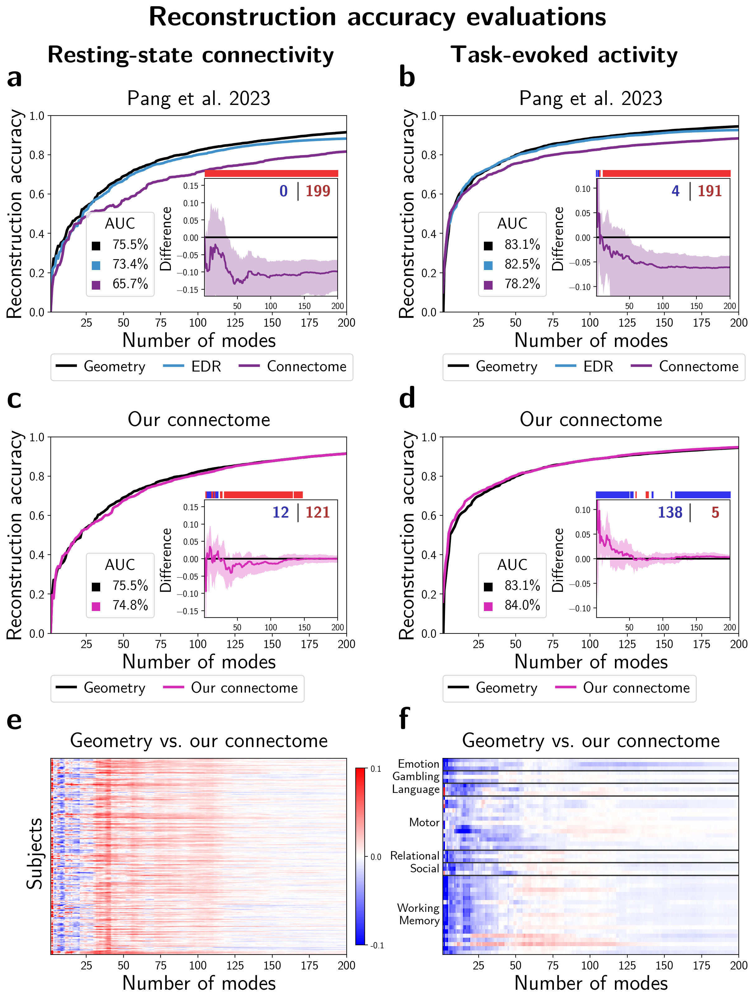

In [19]:
%%time
from matplotlib.patches import Patch
from sklearn.metrics import auc
from statsmodels.stats.multitest import multipletests

rest_subject_keys = list(subject_static_FC_reconstruction_accuracies_rest.keys())

rename_dict = {
    "Geometry (Pang et al.) prediction": "Geometry",
    'EDR (Pang et al.)': 'EDR',
    'Connectome (Pang et al.)': 'Connectome',
}

line_color_dict = {
    "Geometry (Pang et al.) prediction": "#000000",
    "EDR (Pang et al.)": "#4090C9",
    "Connectome (Pang et al.)": "#7E2F8C",
    "Our connectome": "#D42CB4",
    "Density increase to 1%": "#34C4AF",
    "Gyral bias: regression": "#34C467",
    "Gyral bias: tractography": "#C42CA4",
}

rest_keys = [f'rest_{x}' for x in range(1200)]
task_keys = [x for x in task_names]


def subject_reconstruction_atlas_replication_plot(ax, desired_eigenmodes, subject_reconstruction_accuracies, keys, length=200, rename_dict=rename_dict):
    axins = ax.inset_axes([0.52, 0.08, 0.45, 0.6])
    subject_average_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        subject_average_reconstruction_accuracies[eigenmode] = np.mean([subject_reconstruction_accuracies[key][eigenmode].mean(0) for key in keys], 0)
        ax.plot(
            1+np.arange(length),
            subject_average_reconstruction_accuracies[eigenmode][:length],
            label=rename_dict.get(eigenmode, eigenmode),
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
        
        if eigenmode in [desired_eigenmodes[0], desired_eigenmodes[-1]]:
            diff = np.array([
                subject_reconstruction_accuracies[key][eigenmode].mean(0) - subject_reconstruction_accuracies[key][desired_eigenmodes[0]].mean(0)
                for key in keys
            ])
            axins.plot(
                1+np.arange(length),
                diff.mean(0)[:length],
                lw=2,
                c=line_color_dict.get(eigenmode, "#AAA"),
            )
            axins.fill_between(
                1+np.arange(length),
                np.percentile(diff, 97.5, axis=0),
                np.percentile(diff, 2.5, axis=0),
                facecolor=line_color_dict.get(eigenmode, "#AAA"),
                alpha=0.3,
            )
            # statistical testing
            if eigenmode == desired_eigenmodes[-1]:
                p_values = np.array([stats.wilcoxon(diff[:, x])[1] for x in range(length)])
                _, pvals_corrected, _, _ = multipletests(p_values, method='fdr_bh')
                sign = np.sign(diff.mean(0)[:length])
                m1 = (sign > 0) & (pvals_corrected < 0.05)
                m2 = (sign < 0) & (pvals_corrected < 0.05)
                scatter = axins.scatter(
                    (1+np.arange(length))[m1],
                    np.ones(m1.sum()) * 0.13,
                    s=60, marker="|", c='#33E'
                )
                scatter.set_clip_on(False)
                scatter = axins.scatter(
                    (1+np.arange(length))[m2],
                    np.ones(m2.sum()) * 0.13,
                    s=60, marker="|", c='#E33'
                )
                scatter.set_clip_on(False)
                
                axins.text(0.55, 0.85, f"{m1.sum():3.0f}", fontsize=18, weight='bold', ha='center', c='#33A', transform=axins.transAxes)
                axins.text(0.7, 0.85, f"|", fontsize=22, weight='bold', ha='center', c='#333', transform=axins.transAxes)
                axins.text(0.85, 0.85, f"{m2.sum():3.0f}", fontsize=18, weight='bold', ha='center', c='#A33', transform=axins.transAxes)
            
    nauc = [
        auc(np.arange(length), subject_average_reconstruction_accuracies[eigenmode][:length]) / length
        for eigenmode in desired_eigenmodes
    ]
    nauc_dist = np.array([
        [
            auc(np.arange(length), subject_reconstruction_accuracies[key][eigenmode].mean(0)[:length]) / length
            for key in keys
        ] for eigenmode in desired_eigenmodes
    ])
    # report CIs
    n_bootstrap = 1000
    resample_selections = [
        np.random.choice(np.arange(len(keys)), size=len(keys), replace=True)
        for _ in range(n_bootstrap)
    ]
    mean_bootstrap = np.array([nauc_dist[0][selection].mean() for selection in resample_selections])
    print(f'Task bootstrap CIs for {desired_eigenmodes[0]}:\n\t{nauc_dist[0].mean()*100:.1f} [{np.percentile(mean_bootstrap, [2.5, 97.5])}]')
    mean_bootstrap = np.array([nauc_dist[-1][selection].mean() for selection in resample_selections])
    print(f'Task bootstrap CIs for {desired_eigenmodes[-1]}:\n\t{nauc_dist[-1].mean()*100:.1f} [{np.percentile(mean_bootstrap, [2.5, 97.5])}]')
    leg = ax.legend(
        handles=[Patch(facecolor=line_color_dict.get(eigenmode, "#AAA"),) for eigenmode in desired_eigenmodes],
        labels=['{:.1f}%'.format(100*x) for x in nauc],
        loc=(0.12, 0.08),
        ncol=1,
        fontsize=16,
        handlelength=0.7,
        title="AUC", title_fontsize=18,
    )
    leg.set_zorder(30)
    for patch in leg.get_patches():
        patch.set_width(10)
        patch.set_height(10)
        patch.set_y(-2)
    ax.add_artist(leg)

    ax.set_ylim(0,1.)
    ax.set_xlim(1,length)
    ax.tick_params(axis='both', labelsize=14)
    ax.legend(loc=(-0.0, -0.35), ncol=3, fontsize=18, columnspacing=1.2, handlelength=1.2, handletextpad=0.5)
    
    axins.set_ylim(-0.12,0.12)
    axins.set_xlim(1,length)
    axins.set_ylabel("Difference", fontsize=18)
    axins.set_yticks([-0.1, -0.05, 0, 0.05, 0.1])
    
def subject_reconstruction_atlas_comparison_plot(ax, compaired_eigenmodes, subject_reconstruction_accuracies, keys, length=200):
    board = np.zeros((len(keys), length))
    for key in range(len(keys)):
        board[key] = subject_reconstruction_accuracies[keys[key]][compaired_eigenmodes[1]].mean(0) - subject_reconstruction_accuracies[keys[key]][compaired_eigenmodes[0]].mean(0)
    img = ax.imshow(
        board,
        cmap=plt.cm.bwr,
        vmin=-0.1, vmax=0.1, aspect='auto'
    )
    ax.hlines(
        [x + 0.5 for x in [2, 5, 8, 21, 24, 27]], 0, 200, color="#333"
    )

    ax.set_xlim(1,length)
    ax.tick_params(axis='x', labelsize=14)
    ax.set_yticks([])
    rot = 0
    ax.text(-1, 1, "Emotion", rotation=rot, fontsize=14, ha='right', va='center')
    ax.text(-1, 4, "Gambling", rotation=rot, fontsize=14, ha='right', va='center')
    ax.text(-1, 7, "Language", rotation=rot, fontsize=14, ha='right', va='center')
    ax.text(-1, 15, "Motor", rotation=rot, fontsize=14, ha='right', va='center')
    ax.text(-1, 23, "Relational", rotation=rot, fontsize=14, ha='right', va='center')
    ax.text(-1, 26, "Social", rotation=rot, fontsize=14, ha='right', va='center')
    ax.text(-1, 37, "Working\nMemory", rotation=rot, fontsize=14, ha='right', va='center')

    
def subject_static_FC_reconstruction_atlas_replication_plot(ax, desired_eigenmodes, subject_static_FC_reconstruction_accuracies, keys, length=200, rename_dict=rename_dict):
    axins = ax.inset_axes([0.52, 0.08, 0.45, 0.6])
    subject_static_FC_average_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        subject_static_FC_average_reconstruction_accuracies[eigenmode] = np.mean([subject_static_FC_reconstruction_accuracies[key][eigenmode] for key in keys], 0)
        ax.plot(
            1+np.arange(length),
            subject_static_FC_average_reconstruction_accuracies[eigenmode][:length],
            label=rename_dict.get(eigenmode, eigenmode),
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
        if eigenmode in [desired_eigenmodes[0], desired_eigenmodes[-1]]:
            diff = np.array([
                subject_static_FC_reconstruction_accuracies[key][eigenmode] - subject_static_FC_reconstruction_accuracies[key][desired_eigenmodes[0]]
                for key in keys
            ])
            axins.plot(
                1+np.arange(length),
                diff.mean(0)[:length],
                lw=2,
                c=line_color_dict.get(eigenmode, "#AAA"),
            )
            axins.fill_between(
                1+np.arange(length),
                np.percentile(diff, 97.5, axis=0),
                np.percentile(diff, 2.5, axis=0),
                facecolor=line_color_dict.get(eigenmode, "#AAA"),
                alpha=0.3,
            )
            # statistical testing
            if eigenmode == desired_eigenmodes[-1]:
                p_values = np.array([stats.wilcoxon(diff[:, x])[1] for x in range(length)])
                _, pvals_corrected, _, _ = multipletests(p_values, method='fdr_bh')
                sign = np.sign(diff.mean(0)[:length])
                m1 = (sign > 0) & (pvals_corrected < 0.05)
                m2 = (sign < 0) & (pvals_corrected < 0.05)
                scatter = axins.scatter(
                    (1+np.arange(length))[m1],
                    np.ones(m1.sum()) * 0.184,
                    s=60, marker="|", c='#33E'
                )
                scatter.set_clip_on(False)
                scatter = axins.scatter(
                    (1+np.arange(length))[m2],
                    np.ones(m2.sum()) * 0.184,
                    s=60, marker="|", c='#E33'
                )
                scatter.set_clip_on(False)
                
                axins.text(0.55, 0.85, f"{m1.sum():3.0f}", fontsize=18, weight='bold', ha='center', c='#33A', transform=axins.transAxes)
                axins.text(0.7, 0.85, f"|", fontsize=22, weight='bold', ha='center', c='#333', transform=axins.transAxes)
                axins.text(0.85, 0.85, f"{m2.sum():3.0f}", fontsize=18, weight='bold', ha='center', c='#A33', transform=axins.transAxes)
            
    nauc = [
        auc(np.arange(length), subject_static_FC_average_reconstruction_accuracies[eigenmode][:length]) / length
        for eigenmode in desired_eigenmodes
    ]
    nauc_dist = np.array([
        [
            auc(np.arange(length), subject_static_FC_reconstruction_accuracies[key][eigenmode][:length]) / length
            for key in keys
        ] for eigenmode in desired_eigenmodes
    ])
    # report CIs
    n_bootstrap = 1000
    resample_selections = [
        np.random.choice(np.arange(len(keys)), size=len(keys), replace=True)
        for _ in range(n_bootstrap)
    ]
    mean_bootstrap = np.array([nauc_dist[0][selection].mean() for selection in resample_selections])
    print(f'Rest bootstrap CIs for {desired_eigenmodes[0]}:\n\t{nauc_dist[0].mean()*100:.1f} [{np.percentile(mean_bootstrap, [2.5, 97.5])}]')
    mean_bootstrap = np.array([nauc_dist[-1][selection].mean() for selection in resample_selections])
    print(f'Rest bootstrap CIs for {desired_eigenmodes[-1]}:\n\t{nauc_dist[-1].mean()*100:.1f} [{np.percentile(mean_bootstrap, [2.5, 97.5])}]')
    leg = ax.legend(
        handles=[Patch(facecolor=line_color_dict.get(eigenmode, "#AAA"),) for eigenmode in desired_eigenmodes],
        labels=['{:.1f}%'.format(100*x) for x in nauc],
        loc=(0.12, 0.08),
        ncol=1,
        fontsize=16,
        handlelength=0.7,
        title="AUC", title_fontsize=18,
    )
    leg.set_zorder(30)
    for patch in leg.get_patches():
        patch.set_width(10)
        patch.set_height(10)
        patch.set_y(-2)
    ax.add_artist(leg)

    ax.set_ylim(0,1.)
    ax.set_xlim(1,length)
    ax.tick_params(axis='both', labelsize=14)
    ax.legend(loc=(-0.0, -0.35), ncol=3, fontsize=18, columnspacing=1.2, handlelength=1.2, handletextpad=0.5)
    
    axins.set_ylim(-0.17,0.17)
    axins.set_xlim(1,length)
    axins.set_ylabel("Difference", fontsize=18)
    axins.set_yticks([-0.15, -0.1, -0.05, 0, 0.05, 0.1, 0.15])
    
def subject_static_FC_reconstruction_atlas_comparison_plot(ax, compaired_eigenmodes, subject_static_FC_reconstruction_accuracies, keys, length=200):
    board = np.zeros((len(keys), length))
    for key in range(len(keys)):
        board[key] = subject_static_FC_reconstruction_accuracies[keys[key]][compaired_eigenmodes[1]] - subject_static_FC_reconstruction_accuracies[keys[key]][compaired_eigenmodes[0]]
    img = ax.imshow(
        board,
        cmap=plt.cm.bwr,
        vmin=-0.1, vmax=0.1, aspect='auto'
    )
    cbar = fig.colorbar(
        img, ax=ax,
        orientation='vertical', shrink=0.9, pad=-0.0, fraction=0.15, aspect=20,
        ticks=[-0.1, 0, 0.1], format='%0.1f', 
    )

    ax.set_xlim(1,length)
    ax.tick_params(axis='x', labelsize=14)
    ax.set_yticks([])
    ax.text(-3, 122, "Subjects", rotation='vertical', fontsize=24, ha='right', va='center')

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(12, 15))
fig.suptitle("Reconstruction accuracy evaluations", fontsize=32, weight='bold', y = 1.06)
fig.text(0.75, 1.0, "Task-evoked activity", fontsize=28, weight='bold', ha='center',)
fig.text(0.25, 1.0, "Resting-state connectivity", fontsize=28, weight='bold', ha='center',)

gs = GridSpec(3, 6, figure=fig, width_ratios=[1]*6, wspace=0., hspace=0.02, top=0.85)  # left=0.2, bottom=0.2, right=0.8, top=0.8,

ax1 = fig.add_subplot(gs[0, :3])
desired_eigenmodes = ["Geometry (Pang et al.) prediction", 'EDR (Pang et al.)', 'Connectome (Pang et al.)']
subject_static_FC_reconstruction_atlas_replication_plot(ax1, desired_eigenmodes, subject_static_FC_reconstruction_accuracies_rest, rest_subject_keys)
ax1.set_title(f"Pang et al. 2023", fontsize=24, y = 1.03)
ax1.set_ylabel("Reconstruction accuracy", fontsize=24)
ax1.set_xlabel("Number of modes", fontsize=24)
ax1.text(-0.15, 1.15, "a", fontsize=36, weight="bold", transform=ax1.transAxes)

ax2 = fig.add_subplot(gs[1, :3])
desired_eigenmodes = ["Geometry (Pang et al.) prediction", "Our connectome"]
subject_static_FC_reconstruction_atlas_replication_plot(ax2, desired_eigenmodes, subject_static_FC_reconstruction_accuracies_rest, rest_subject_keys)
ax2.set_title(f"Our connectome", fontsize=24, y = 1.03)
ax2.set_ylabel("Reconstruction accuracy", fontsize=24)
ax2.set_xlabel("Number of modes", fontsize=24)
ax2.text(-0.15, 1.15, "c", fontsize=36, weight="bold", transform=ax2.transAxes)

ax3 = fig.add_subplot(gs[2, :3])
compaired_eigenmodes = ["Our connectome", "Geometry (Pang et al.) prediction"]
subject_static_FC_reconstruction_atlas_comparison_plot(ax3, compaired_eigenmodes, subject_static_FC_reconstruction_accuracies_rest, rest_subject_keys)
ax3.set_title(f"Geometry vs. our connectome", fontsize=24, y = 1.03)
ax3.set_xlabel("Number of modes", fontsize=24)
ax3.text(-0.15, 1.15, "e", fontsize=36, weight="bold", transform=ax3.transAxes)

ax4 = fig.add_subplot(gs[0, 3:])
desired_eigenmodes = ["Geometry (Pang et al.) prediction", 'EDR (Pang et al.)', 'Connectome (Pang et al.)']
subject_reconstruction_atlas_replication_plot(ax4, desired_eigenmodes, subject_reconstruction_accuracies_atlas, task_keys)
ax4.set_title(f"Pang et al. 2023", fontsize=24, y = 1.03)
ax4.set_ylabel("Reconstruction accuracy", fontsize=24)
ax4.set_xlabel("Number of modes", fontsize=24)
ax4.text(-0.15, 1.15, "b", fontsize=36, weight="bold", transform=ax4.transAxes)

ax5 = fig.add_subplot(gs[1, 3:])
desired_eigenmodes = ["Geometry (Pang et al.) prediction", "Our connectome"]
subject_reconstruction_atlas_replication_plot(ax5, desired_eigenmodes, subject_reconstruction_accuracies_atlas, task_keys)
ax5.set_title(f"Our connectome", fontsize=24, y = 1.03)
ax5.set_ylabel("Reconstruction accuracy", fontsize=24)
ax5.set_xlabel("Number of modes", fontsize=24)
ax5.text(-0.15, 1.15, "d", fontsize=36, weight="bold", transform=ax5.transAxes)

ax6 = fig.add_subplot(gs[2, 3:])
compaired_eigenmodes = ["Our connectome", "Geometry (Pang et al.) prediction"]
subject_reconstruction_atlas_comparison_plot(ax6, compaired_eigenmodes, subject_reconstruction_accuracies_atlas, task_keys)
ax6.set_title(f"Geometry vs. our connectome", fontsize=24, y = 1.03)
ax6.set_xlabel("Number of modes", fontsize=24)
ax6.text(-0.15, 1.15, "f", fontsize=36, weight="bold", transform=ax6.transAxes)

pass

### Eigenmode visualizations

---

The scripts bellow generates visualizations of the various eigenmodes (as presented in the manuscript).


CPU times: user 7min 47s, sys: 6min 54s, total: 14min 41s
Wall time: 1min 29s


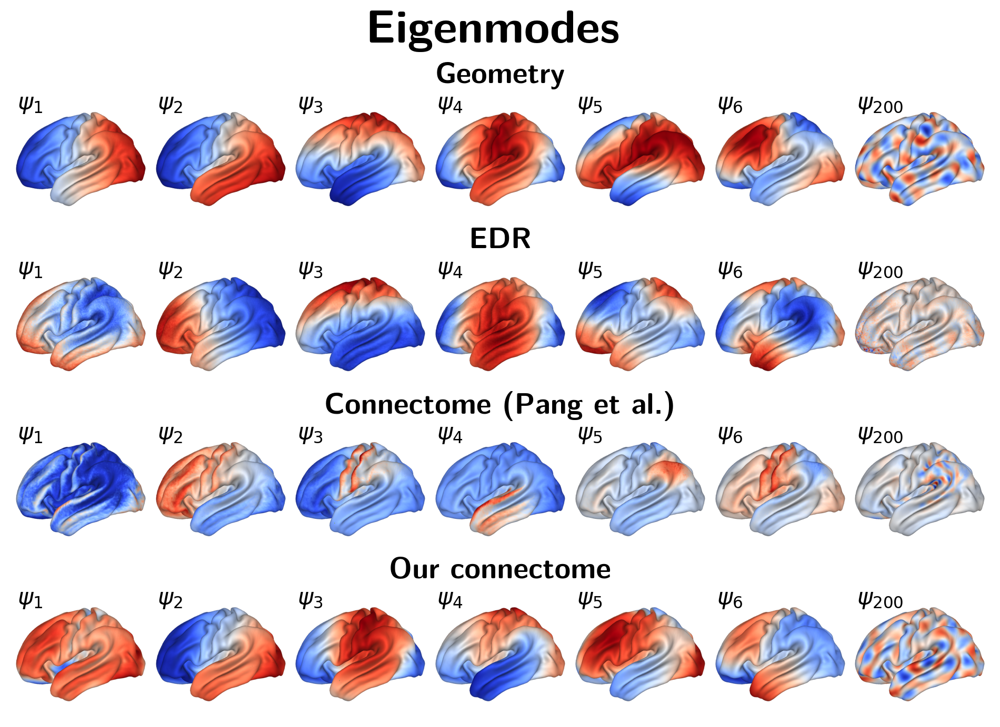

In [18]:
%%time
%config InlineBackend.figure_format = 'retina'

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(12, 8))
fig.tight_layout(h_pad=0)
fig.suptitle(" Eigenmodes", fontsize=32, x=0.5, y=0.95, weight='bold', ha="center")

desired_eigenmodes = ['Geometry (Pang et al.)', 'EDR (Pang et al.)', 'Connectome (Pang et al.)', 'Our connectome']
names = {
    'Geometry (Pang et al.)': 'Geometry',
    'EDR (Pang et al.)': 'EDR',
    'Connectome (Pang et al.)': 'Connectome (Pang et al.)',
    'Our connectome': 'Our connectome'
}
gs = GridSpec(len(desired_eigenmodes), 7, figure=fig, width_ratios=[1]*7, wspace=0.0, hspace=0.3, top=0.85)  # left=0.2, bottom=0.2, right=0.8, top=0.8, 

for i, eigenmode in enumerate(desired_eigenmodes):
    for j in range(7):
        ax = fig.add_subplot(gs[i, j], zorder=20)

        if j < 6:
            eig = j
        else:
            eig = 199

        signal = eigenmodes[eigenmode].T[eig]
        plot_left_surface_with_cerebro(
            signal,
            ax,
        )
        ax.axis('off')
        # ax.set_xticks([])
        # ax.set_yticks([])

        ax.text(0.05, 1.01, f'$\psi_{{{1 + eig}}}$', ha='left', va='top', transform=ax.transAxes, fontsize=16)

        if j == 3:
            fig.text(0.5, 1.15, names[eigenmode], fontsize=20, weight='bold', ha='center', va='center', transform=ax.transAxes, zorder=40)


#### Spatial correspondence

---


In [ ]:
%%time

from scipy.optimize import linear_sum_assignment

# Statistical comparisons of spatial similarity between eigenmodes from Geometry against EDR, Connectome (Pang et al.), and Our connectome

def compute_eigenmode_similarity(eigenmodes1_sphere, eigenmodes2_sphere):
    # create a mask of nans to exclude the medial wall
    mask = ~(np.isnan(eigenmodes1_sphere).any(1) | np.isnan(eigenmodes2_sphere).any(1))
    
    # Compute correlations and similarities between eigenmodes
    eigenmodes1_demeaned = (eigenmodes1_sphere[mask] - np.mean(eigenmodes1_sphere[mask], axis=0))
    eigenmodes2_demeaned = (eigenmodes2_sphere[mask] - np.mean(eigenmodes2_sphere[mask], axis=0))
    eigenmodes1_normalized = eigenmodes1_demeaned/np.linalg.norm(eigenmodes1_demeaned, axis=0)
    eigenmodes2_normalized = eigenmodes2_demeaned/np.linalg.norm(eigenmodes2_demeaned, axis=0)    
    correlations = np.dot(eigenmodes1_normalized.T, eigenmodes2_normalized)
    similarity = np.abs(correlations)
    
    return correlations, similarity

def project_eigenmodes_to_sphere(eigenmodes):
    # create an array full of nans
    eigenmodes_sphere = np.full((vertices.shape[0], eigenmodes.shape[1]), np.nan)
    # fill everywhere, but the medial wall using the eigenmodes
    eigenmodes_sphere[vertex_indices] = eigenmodes
    return eigenmodes_sphere

eig1 = "Geometry (Pang et al.)"
eigenmodes1_sphere = project_eigenmodes_to_sphere(eigenmodes[eig1])
permutation_performances = {
    (eig1, eig2): []
    for eig2 in ["EDR (Pang et al.)", "Connectome (Pang et al.)", "Our connectome"]
}

for eig2 in ["EDR (Pang et al.)", "Connectome (Pang et al.)", "Our connectome"]:
    print(f"Pairs: {eig1}, {eig2}")
    eigenmodes2_sphere = project_eigenmodes_to_sphere(eigenmodes[eig2])
    # Nonparametric permutation testing
    permutations = 10000
    for p in tqdm(range(permutations), desc=f"Permutations: {eig1} <---> {eig2}"):
        # Compute similarities between rotated eigenmodes
        _, permutated_similarity = compute_eigenmode_similarity(eigenmodes1_sphere[get_permuation_rotations(p)], eigenmodes2_sphere)
        # get maximum weighted matching
        p_row_indices, p_col_indices = linear_sum_assignment(-permutated_similarity)
        # store the maximum weighted matches
        permutation_performances[(eig1, eig2)].append(permutated_similarity[p_row_indices, p_col_indices])
    permutation_performances[(eig1, eig2)] = np.array(permutation_performances[(eig1, eig2)])


CPU times: user 24min 46s, sys: 9min 13s, total: 33min 59s
Wall time: 28min 51s


Text(0, 0.5, 'Matched similarity')

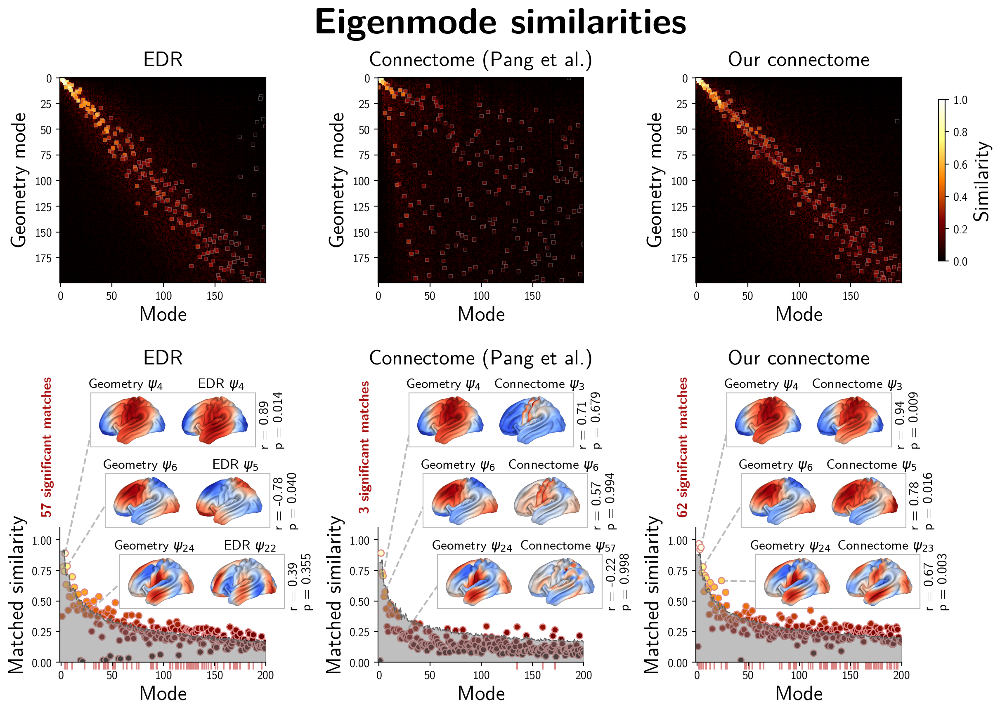

In [1808]:
%%time
%config InlineBackend.figure_format = 'retina'

from statsmodels.stats.multitest import multipletests

def compare_eigenbases(eigenmodes1, eigenmodes2, permutation_performance, ax1, ax2, name1="", name2="", pairs=[], colorbar=False):
    # first, put eigenmodes on sphere for the purpose of the spin test
    eigenmodes1_sphere = project_eigenmodes_to_sphere(eigenmodes1)
    eigenmodes2_sphere = project_eigenmodes_to_sphere(eigenmodes2)
    
    # Compute correlations and similarities between eigenmodes
    correlations, similarity = compute_eigenmode_similarity(eigenmodes1_sphere, eigenmodes2_sphere)
    
    # get maximum weighted matching
    row_indices, col_indices = linear_sum_assignment(-similarity)
    
    img = ax1.imshow(
        similarity, cmap=plt.cm.afmhot, vmin=0, vmax=1,
    )
    if colorbar:
        cbar = plt.colorbar(img, ax=ax1, pad=-0.05, aspect=24, shrink=0.75, orientation="vertical")
        cbar.set_label("Similarity", fontsize=18)
    ax1.scatter(
        col_indices, row_indices,
        c=similarity[row_indices, col_indices], cmap=plt.cm.afmhot,
        lw=0.5,
        edgecolor=[[0.9, 0.9, 0.9, 0.3]],
        s=10, marker='s',
    )
    ax1.set_xlabel("Mode", fontsize=18)
    
    ax2.scatter(
        np.arange(similarity.shape[0]) + 1,
        similarity[row_indices, col_indices],
        c=plt.cm.afmhot(similarity[row_indices, col_indices]),
        edgecolor='#D88', zorder=20, lw=1, s=30,
    )
    ax2.plot(
        np.arange(similarity.shape[0]) + 1,
        np.percentile(permutation_performance, 95, axis=0),
        c='#333', zorder=21, linestyle='--', lw=1,
    )
    ax2.fill_between(
        np.concatenate([[-1000], np.arange(similarity.shape[0]) + 1]),
        np.concatenate([[0], np.percentile(permutation_performance, 95, axis=0)]),
        color=(0.5, 0.5, 0.5, 0.5), zorder=23,
    )
    permutations = permutation_performance.shape[0]
    pval = np.array([
        max(1/permutations, (1 - (stats.percentileofscore(permutation_performance[:, i], similarity[i,j]) / 100)))
        for (i, j) in zip(row_indices, col_indices)]
    )
    _, pval_corrected, _, _ = multipletests(pval, method='fdr_bh')
    mask = pval_corrected < 0.05
    scatter = ax2.scatter(
        (np.arange(similarity.shape[0]) + 1)[mask],
        np.ones(mask.sum()) * -0.0,
        s=40, marker=3, c='#D88'
    )
    scatter.set_clip_on(False)
    ax2.text(-0.06, 1.6, f"{mask.sum()} significant matches", c="#A11", zorder=30, rotation='vertical', fontsize=12, ha='center', va='center', weight='bold', transform=ax2.transAxes,)
    ax2.set_xlim(-1,200)
    ax2.set_ylim(-0.0,1.1)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.set_xlabel("Mode", fontsize=18)
    
    axis_locations = [
        [0.15, 1.6, 0.8, 0.4],
        [0.22, 1., 0.8, 0.4],
        [0.29, 0.4, 0.8, 0.4],
    ]
    for i, pair in enumerate(pairs):
        axis_location = axis_locations[i]
        loc1 = pair
        loc2 = col_indices[loc1]
        line = ax2.plot(
            [loc1 + 1, (axis_location[0] + 0.01) * similarity.shape[0]],
            [similarity[loc1, loc2], 1.1*(axis_location[1] + axis_location[3]/2)],
            c='#BBB', zorder=-1, linestyle='--', clip_on=False,
        )
        
        axins = ax2.inset_axes(axis_location)
        axins.set_xticks([])
        axins.set_yticks([])
        
        for spine in axins.spines.values():
            spine.set_color("#BBB")
            
        axins.text(0.21, 1.1, f"{name1} $\psi_{{{1 + loc1}}}$", fontsize=12, ha='center',)
        axins.text(0.79, 1.1, f"{name2} $\psi_{{{1 + loc2}}}$", fontsize=12, ha='center',)
        axins.text(
            1.02, 0.5,
            f"r = {correlations[loc1,loc2]:.2f}\np = {pval_corrected[loc1]:.3f}",
            fontsize=12, va='center', rotation='vertical'
        )
        
        axins1 = axins.inset_axes([0.01, 0.02, 0.48, 0.96])
        plot_left_surface_with_cerebro(
            eigenmodes1.T[loc1],
            axins1,
        )
        axins1.axis('off')
        
        axins2 = axins.inset_axes([0.51, 0.02, 0.48, 0.96])
        plot_left_surface_with_cerebro(
            eigenmodes2.T[loc2],
            axins2,
        )
        axins2.axis('off')
    
    return ax1, ax2
    

fig = plt.figure(layout="constrained", figsize=(12, 8))
fig.suptitle("Eigenmode similarities", fontsize=32, x=0.5, y=1.06, weight='bold',)
gs = GridSpec(2, 3, width_ratios=[1, 1, 1], height_ratios=[1.6, 1], figure=fig, wspace=0.04, hspace=0.08, top=0.85)
modes = [3, 5, 23]

ax1, ax2 = compare_eigenbases(
    eigenmodes["Geometry (Pang et al.)"],
    eigenmodes["EDR (Pang et al.)"],
    permutation_performances[("Geometry (Pang et al.)", "EDR (Pang et al.)")],
    fig.add_subplot(gs[0, 0]),
    fig.add_subplot(gs[1, 0]),
    "Geometry", "EDR", modes,
)
ax1.set_title("EDR", pad=10, fontsize=18,)
ax1.set_ylabel("Geometry mode", fontsize=18,)
ax2.set_title("EDR", pad=25, fontsize=18,)
ax2.set_ylabel("Matched similarity", fontsize=18,)

ax3, ax4 =compare_eigenbases(
    eigenmodes["Geometry (Pang et al.)"],
    eigenmodes["Connectome (Pang et al.)"],
    permutation_performances[("Geometry (Pang et al.)", "Connectome (Pang et al.)")],
    fig.add_subplot(gs[0, 1]),
    fig.add_subplot(gs[1, 1]),
    "Geometry", "Connectome", modes,
)
ax3.set_title("Connectome (Pang et al.)", pad=10, fontsize=18,)
ax3.set_ylabel("Geometry mode", fontsize=18,)
ax4.set_title("Connectome (Pang et al.)", pad=25, fontsize=18,)
ax4.set_ylabel("Matched similarity", fontsize=18,)

ax5, ax6 =compare_eigenbases(
    eigenmodes["Geometry (Pang et al.)"],
    eigenmodes["Our connectome"],
    permutation_performances[("Geometry (Pang et al.)", "Our connectome")],
    fig.add_subplot(gs[0, 2]),
    fig.add_subplot(gs[1, 2]),
    "Geometry", "Connectome", modes, colorbar=True,
)
ax5.set_title("Our connectome", pad=10, fontsize=18,)
ax5.set_ylabel("Geometry mode", fontsize=18,)
ax6.set_title("Our connectome", pad=25, fontsize=18,)
ax6.set_ylabel("Matched similarity", fontsize=18,)



## Supplementary results

---

The scripts bellow generates the supplementary figures.


### Gyral bias effects

---


In [23]:
%%time

# load Pang et al.'s connectome
pang_connectome = sparse.load_npz(f"{data_dir}/connectomes/pang_group_average_connectome.npz")

# perform gyral bias regression
pang_connectome_reg = regress_gyral_bias(pang_connectome)

# load our connectome
our_connectome = sparse.load_npz(f"{data_dir}/connectomes/our_group_average_connectome.npz")

# load curvature information
curvature = nib.load(f"{data_dir}/templates/S1200.curvature_MSMAll.32k_fs_LR.dscalar.nii").get_fdata()[0,:pang_connectome.shape[0]]


CPU times: user 15.4 s, sys: 8.31 s, total: 23.7 s
Wall time: 23.5 s


CPU times: user 1min 17s, sys: 1min 6s, total: 2min 23s
Wall time: 20.1 s


Text(0.05, 0.85, 'r = 0.16')

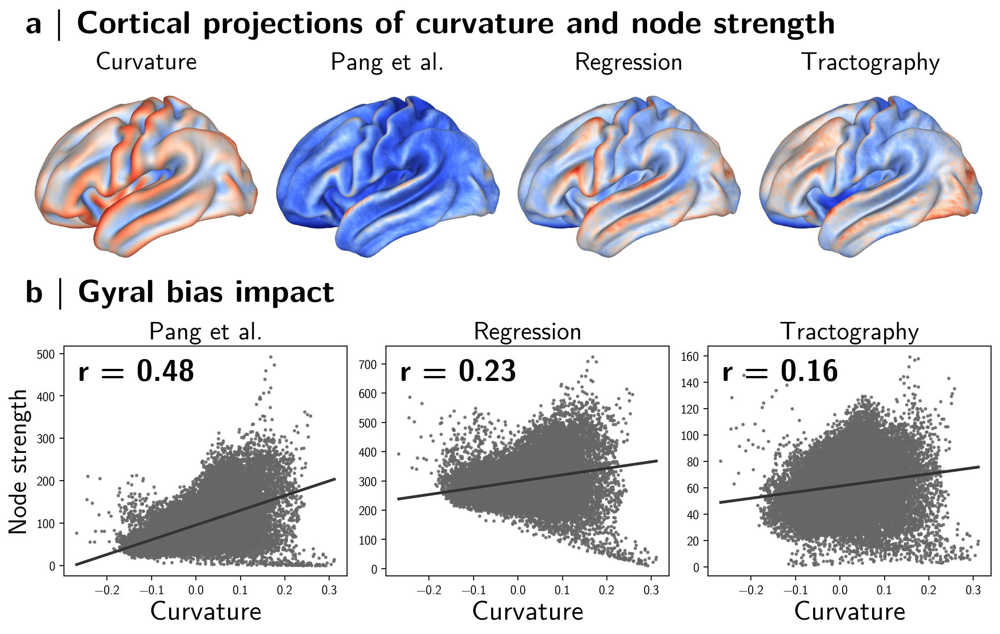

In [24]:
%%time

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(12, 7))
fig.tight_layout(h_pad=0.5)

gs = GridSpec(2, 12, figure=fig, width_ratios=[1]*12, height_ratios=[3, 4], wspace=0.0, hspace=0.3, top=0.95, left=0.05, right=0.95)

fig.text(0.05, 1.02, "a | Cortical projections of curvature and node strength", fontsize=26, weight='bold', ha='left',)
fig.text(0.05, 0.59, "b | Gyral bias impact", fontsize=26, weight='bold', ha='left',)

ax1 = fig.add_subplot(gs[0, :3])
plot_left_surface_with_cerebro(curvature, ax1,)
ax1.set_title("Curvature", fontsize=20, weight='normal', ha='center',)

ax2 = fig.add_subplot(gs[0, 3:6])
plot_left_surface_with_cerebro(np.array(pang_connectome.sum(0))[0], ax2)
ax2.set_title("Pang et al.", fontsize=20, weight='normal', ha='center',)

ax3 = fig.add_subplot(gs[0, 6:9])
plot_left_surface_with_cerebro(np.array(pang_connectome_reg.sum(0))[0], ax3)
ax3.set_title("Regression", fontsize=20, weight='normal', ha='center',)

ax4 = fig.add_subplot(gs[0, 9:])
plot_left_surface_with_cerebro(np.array(our_connectome.sum(0))[0], ax4)
ax4.set_title("Tractography", fontsize=20, weight='normal', ha='center',)

ax5 = fig.add_subplot(gs[1, :4])
ax5.axis('off')
ax5 = ax5.inset_axes([0.12, 0.1, 0.88, 0.88])
sns.regplot(
    x=curvature,
    y=(np.array(pang_connectome.sum(0))[0]),
    scatter_kws={'s': 3, 'color':"#666"},
    line_kws={'color':"#333"},
    ax=ax5,
)
ax5.set_xlabel("Curvature", fontsize=22)
ax5.set_ylabel("Node strength", fontsize=20)
ax5.set_title("Pang et al.", fontsize=20)
ax5.text(0.05, 0.85, f"r = {np.corrcoef(curvature, (np.array(pang_connectome.sum(0))[0]))[0, 1]:.2f}", transform=ax5.transAxes, fontsize=24, weight='bold')

ax6 = fig.add_subplot(gs[1, 4:8])
ax6.axis('off')
ax6 = ax6.inset_axes([0.12, 0.1, 0.88, 0.88])
sns.regplot(
    x=curvature,
    y=(np.array(pang_connectome_reg.sum(0))[0]),
    scatter_kws={'s': 3, 'color':"#666"},
    line_kws={'color':"#333"},
    ax=ax6,
)
ax6.set_xlabel("Curvature", fontsize=22)
ax6.set_title("Regression", fontsize=20)
ax6.text(0.05, 0.85, f"r = {np.corrcoef(curvature, (np.array(pang_connectome_reg.sum(0))[0]))[0, 1]:.2f}", transform=ax6.transAxes, fontsize=24, weight='bold')

ax7 = fig.add_subplot(gs[1, 8:12])
ax7.axis('off')
ax7 = ax7.inset_axes([0.12, 0.1, 0.88, 0.88])
sns.regplot(
    x=curvature,
    y=(np.array(our_connectome.sum(0))[0]),
    scatter_kws={'s': 3, 'color':"#666"},
    line_kws={'color':"#333"},
    ax=ax7,
)
ax7.set_xlabel("Curvature", fontsize=22)
ax7.set_title("Tractography", fontsize=20)
ax7.text(0.05, 0.85, f"r = {np.corrcoef(curvature, (np.array(our_connectome.sum(0))[0]))[0, 1]:.2f}", transform=ax7.transAxes, fontsize=24, weight='bold')


### Breakdown of influential procedures

---


CPU times: user 2.23 s, sys: 6.66 ms, total: 2.24 s
Wall time: 2.22 s


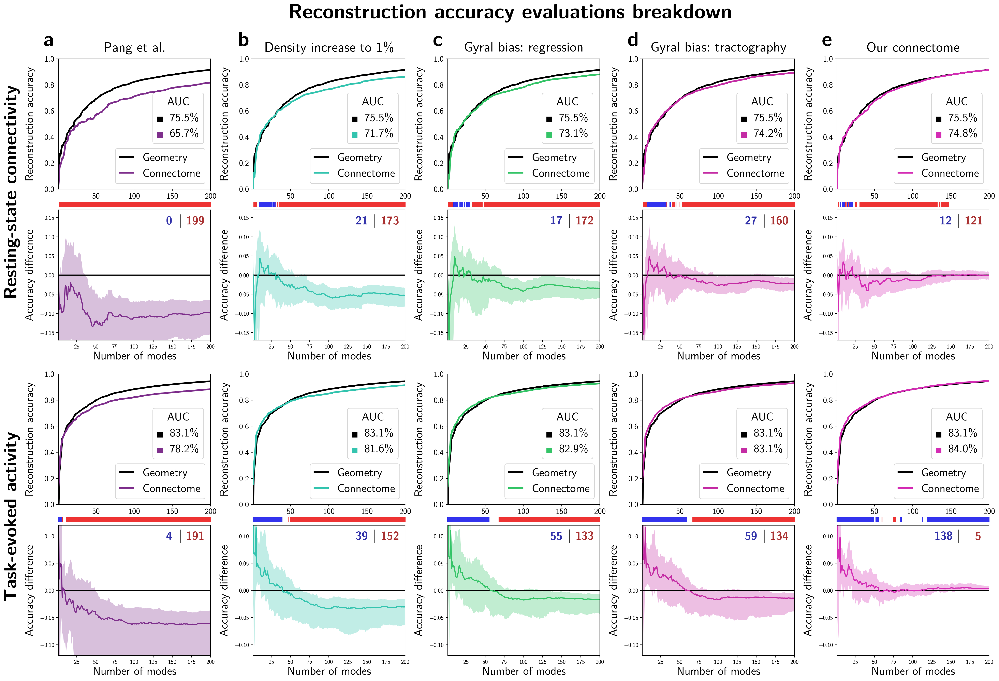

In [31]:
%%time
from matplotlib.patches import Patch
from sklearn.metrics import auc
from statsmodels.stats.multitest import multipletests

rename_dict = {
    "Geometry (Pang et al.) prediction": "Geometry",
    'EDR (Pang et al.)': 'EDR',
    'Connectome (Pang et al.)': 'Connectome',
    "Our connectome": "Connectome",
    "Density increase to 1%": "Connectome",
    "Gyral bias: regression": "Connectome",
    "Gyral bias: tractography": "Connectome",
}

line_color_dict = {
    "Geometry (Pang et al.) prediction": "#000000",
    "EDR (Pang et al.)": "#4090C9",
    "Connectome (Pang et al.)": "#7E2F8C",
    "Our connectome": "#D42CB4",
    "Density increase to 1%": "#34C4AF",
    "Gyral bias: regression": "#34C467",
    "Gyral bias: tractography": "#C42CA4",
}

def subject_reconstruction_atlas_replication_plot_systematic(ax, axdiff, desired_eigenmodes, subject_reconstruction_accuracies, keys, length=200):
    axins = axdiff
    subject_average_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        subject_average_reconstruction_accuracies[eigenmode] = np.mean([subject_reconstruction_accuracies[key][eigenmode].mean(0) for key in keys], 0)
        ax.plot(
            1+np.arange(length),
            subject_average_reconstruction_accuracies[eigenmode][:length],
            label=rename_dict.get(eigenmode, eigenmode),
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
        
        if eigenmode in [desired_eigenmodes[0], desired_eigenmodes[-1]]:
        # if True:
            diff = np.array([
                subject_reconstruction_accuracies[key][eigenmode].mean(0) - subject_reconstruction_accuracies[key][desired_eigenmodes[0]].mean(0)
                for key in keys
            ])
            axins.plot(
                1+np.arange(length),
                diff.mean(0)[:length],
                lw=2,
                c=line_color_dict.get(eigenmode, "#AAA"),
            )
            axins.fill_between(
                1+np.arange(length),
                np.percentile(diff, 97.5, axis=0),
                np.percentile(diff, 2.5, axis=0),
                facecolor=line_color_dict.get(eigenmode, "#AAA"),
                alpha=0.3,
            )
            # statistical testing
            if eigenmode == desired_eigenmodes[-1]:
                p_values = np.array([stats.wilcoxon(diff[:, x])[1] for x in range(length)])
                _, pvals_corrected, _, _ = multipletests(p_values, method='fdr_bh')
                # print(pvals_corrected)
                sign = np.sign(diff.mean(0)[:length])
                m1 = (sign > 0) & (pvals_corrected < 0.05)
                m2 = (sign < 0) & (pvals_corrected < 0.05)
                scatter = axins.scatter(
                    (1+np.arange(length))[m1],
                    np.ones(m1.sum()) * 0.13,
                    s=80, marker="|", c='#33E'
                )
                scatter.set_clip_on(False)
                scatter = axins.scatter(
                    (1+np.arange(length))[m2],
                    np.ones(m2.sum()) * 0.13,
                    s=80, marker="|", c='#E33'
                )
                scatter.set_clip_on(False)
                
                axins.text(0.7, 0.89, f"{m1.sum():3.0f}", fontsize=20, weight='bold', ha='center', c='#33A', transform=axins.transAxes)
                axins.text(0.8, 0.89, f"|", fontsize=24, weight='bold', ha='center', c='#333', transform=axins.transAxes)
                axins.text(0.9, 0.89, f"{m2.sum():3.0f}", fontsize=20, weight='bold', ha='center', c='#A33', transform=axins.transAxes)
            
    nauc = [
        auc(np.arange(length), subject_average_reconstruction_accuracies[eigenmode][:length]) / length
        for eigenmode in desired_eigenmodes
    ]
    leg = ax.legend(
        handles=[Patch(facecolor=line_color_dict.get(eigenmode, "#AAA"),) for eigenmode in desired_eigenmodes],
        labels=['{:.1f}%'.format(100*x) for x in nauc],
        loc=(0.62, 0.35),
        ncol=1,
        title="AUC", title_fontsize=20,
        fontsize=20,
        handlelength=0.3,
    )
    leg.set_zorder(30)
    for patch in leg.get_patches():
        patch.set_width(10)
        patch.set_height(10)
        patch.set_y(-2)
    ax.add_artist(leg)

    ax.set_ylim(0,1.)
    ax.set_xlim(1,length)
    ax.tick_params(axis='both', labelsize=14)
    ax.legend(loc="lower right", fontsize=20, handlelength=1.2)
    
    axins.set_ylim(-0.12,0.12)
    axins.set_xlim(1,length)
    axins.set_ylabel("difference", fontsize=14)
    axins.set_yticks([-0.1, -0.05, 0, 0.05, 0.1])


def subject_static_FC_reconstruction_atlas_replication_plot_systematic(ax, axdiff, desired_eigenmodes, subject_static_FC_reconstruction_accuracies, keys, length=200):
    axins = axdiff
    subject_static_FC_average_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        subject_static_FC_average_reconstruction_accuracies[eigenmode] = np.mean([subject_static_FC_reconstruction_accuracies[key][eigenmode] for key in keys], 0)
        ax.plot(
            1+np.arange(length),
            subject_static_FC_average_reconstruction_accuracies[eigenmode][:length],
            label=rename_dict.get(eigenmode, eigenmode),
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
        if eigenmode in [desired_eigenmodes[0], desired_eigenmodes[-1]]:
            diff = np.array([
                subject_static_FC_reconstruction_accuracies[key][eigenmode] - subject_static_FC_reconstruction_accuracies[key][desired_eigenmodes[0]]
                for key in keys
            ])
            axins.plot(
                1+np.arange(length),
                diff.mean(0)[:length],
                lw=2,
                c=line_color_dict.get(eigenmode, "#AAA"),
            )
            axins.fill_between(
                1+np.arange(length),
                np.percentile(diff, 97.5, axis=0),
                np.percentile(diff, 2.5, axis=0),
                facecolor=line_color_dict.get(eigenmode, "#AAA"),
                alpha=0.3,
            )
            # statistical testing
            if eigenmode == desired_eigenmodes[-1]:
                p_values = np.array([stats.wilcoxon(diff[:, x])[1] for x in range(length)])
                _, pvals_corrected, _, _ = multipletests(p_values, method='fdr_bh')
                sign = np.sign(diff.mean(0)[:length])
                m1 = (sign > 0) & (pvals_corrected < 0.05)
                m2 = (sign < 0) & (pvals_corrected < 0.05)
                scatter = axins.scatter(
                    (1+np.arange(length))[m1],
                    np.ones(m1.sum()) * 0.184,
                    s=80, marker="|", c='#33E'
                )
                scatter.set_clip_on(False)
                scatter = axins.scatter(
                    (1+np.arange(length))[m2],
                    np.ones(m2.sum()) * 0.184,
                    s=80, marker="|", c='#E33'
                )
                scatter.set_clip_on(False)
                
                axins.text(0.7, 0.89, f"{m1.sum():3.0f}", fontsize=20, weight='bold', ha='center', c='#33A', transform=axins.transAxes)
                axins.text(0.8, 0.89, f"|", fontsize=24, weight='bold', ha='center', c='#333', transform=axins.transAxes)
                axins.text(0.9, 0.89, f"{m2.sum():3.0f}", fontsize=20, weight='bold', ha='center', c='#A33', transform=axins.transAxes)
            
    nauc = [
        auc(np.arange(length), subject_static_FC_average_reconstruction_accuracies[eigenmode][:length]) / length
        for eigenmode in desired_eigenmodes
    ]
    leg = ax.legend(
        handles=[Patch(facecolor=line_color_dict.get(eigenmode, "#AAA"),) for eigenmode in desired_eigenmodes],
        labels=['{:.1f}%'.format(100*x) for x in nauc],
        loc=(0.62, 0.35),
        ncol=1,
        title="AUC", title_fontsize=20,
        fontsize=20,
        handlelength=0.3,
    )
    leg.set_zorder(30)
    for patch in leg.get_patches():
        patch.set_width(10)
        patch.set_height(10)
        patch.set_y(-2)
    ax.add_artist(leg)

    ax.set_ylim(0,1.)
    ax.set_xlim(1,length)
    ax.tick_params(axis='both', labelsize=14)
    ax.legend(loc="lower right", fontsize=20, handlelength=1.2)
    
    axins.set_ylim(-0.17,0.17)
    axins.set_xlim(1,length)
    axins.set_ylabel("difference", fontsize=14)
    axins.set_yticks([-0.15, -0.1, -0.05, 0, 0.05, 0.1, 0.15])

rest_subject_keys = list(subject_static_FC_reconstruction_accuracies_rest.keys())

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(24, 16))
fig.suptitle("Reconstruction accuracy evaluations breakdown", fontsize=36, weight='bold', y = 1.04)
fig.text(-0.02, .25, "Task-evoked activity", fontsize=32, weight='bold', va='center', rotation="vertical")
fig.text(-0.02, .75, "Resting-state connectivity", fontsize=32, weight='bold', va='center', rotation="vertical")

gs = GridSpec(4, 5, figure=fig, width_ratios=[1]*5, wspace=0., hspace=0.06, top=0.85)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])
desired_eigenmodes = ["Geometry (Pang et al.) prediction", 'Connectome (Pang et al.)']
subject_static_FC_reconstruction_atlas_replication_plot_systematic(ax1, ax2, desired_eigenmodes, subject_static_FC_reconstruction_accuracies_rest, rest_subject_keys)
ax1.text(-0.1, 1.1, "a", fontsize=36, weight="bold", transform=ax1.transAxes)
ax1.set_title(f"Pang et al.", fontsize=24, y = 1.03)
ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
ax1.yaxis.set_label_coords(-0.15, 0.5)
ax2.set_ylabel("Accuracy difference", fontsize=20)
ax2.yaxis.set_label_coords(-0.15, 0.5)
ax2.set_xlabel("Number of modes", fontsize=20)
ax3 = fig.add_subplot(gs[2, 0])
ax4 = fig.add_subplot(gs[3, 0])
subject_reconstruction_atlas_replication_plot_systematic(ax3, ax4, desired_eigenmodes, subject_reconstruction_accuracies_atlas, task_keys)
ax3.set_ylabel("Reconstruction accuracy", fontsize=20)
ax3.yaxis.set_label_coords(-0.15, 0.5)
ax4.set_ylabel("Accuracy difference", fontsize=20)
ax4.yaxis.set_label_coords(-0.15, 0.5)
ax4.set_xlabel("Number of modes", fontsize=20)

ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[1, 1])
desired_eigenmodes = ["Geometry (Pang et al.) prediction", 'Density increase to 1%']
subject_static_FC_reconstruction_atlas_replication_plot_systematic(ax1, ax2, desired_eigenmodes, subject_static_FC_reconstruction_accuracies_rest, rest_subject_keys)
ax1.text(-0.1, 1.1, "b", fontsize=36, weight="bold", transform=ax1.transAxes)
ax1.set_title(f"Density increase to 1%", fontsize=24, y = 1.03)
ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
ax1.yaxis.set_label_coords(-0.15, 0.5)
ax2.set_ylabel("Accuracy difference", fontsize=20)
ax2.yaxis.set_label_coords(-0.15, 0.5)
ax2.set_xlabel("Number of modes", fontsize=20)
ax3 = fig.add_subplot(gs[2, 1])
ax4 = fig.add_subplot(gs[3, 1])
subject_reconstruction_atlas_replication_plot_systematic(ax3, ax4, desired_eigenmodes, subject_reconstruction_accuracies_atlas, task_keys)
ax3.set_ylabel("Reconstruction accuracy", fontsize=20)
ax3.yaxis.set_label_coords(-0.15, 0.5)
ax4.set_ylabel("Accuracy difference", fontsize=20)
ax4.yaxis.set_label_coords(-0.15, 0.5)
ax4.set_xlabel("Number of modes", fontsize=20)

ax1 = fig.add_subplot(gs[0, 2])
ax2 = fig.add_subplot(gs[1, 2])
desired_eigenmodes = ["Geometry (Pang et al.) prediction", 'Gyral bias: regression']
subject_static_FC_reconstruction_atlas_replication_plot_systematic(ax1, ax2, desired_eigenmodes, subject_static_FC_reconstruction_accuracies_rest, rest_subject_keys)
ax1.text(-0.1, 1.1, "c", fontsize=36, weight="bold", transform=ax1.transAxes)
ax1.set_title(f"Gyral bias: regression", fontsize=24, y = 1.03)
ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
ax1.yaxis.set_label_coords(-0.15, 0.5)
ax2.set_ylabel("Accuracy difference", fontsize=20)
ax2.yaxis.set_label_coords(-0.15, 0.5)
ax2.set_xlabel("Number of modes", fontsize=20)
ax3 = fig.add_subplot(gs[2, 2])
ax4 = fig.add_subplot(gs[3, 2])
subject_reconstruction_atlas_replication_plot_systematic(ax3, ax4, desired_eigenmodes, subject_reconstruction_accuracies_atlas, task_keys)
ax3.set_ylabel("Reconstruction accuracy", fontsize=20)
ax3.yaxis.set_label_coords(-0.15, 0.5)
ax4.set_ylabel("Accuracy difference", fontsize=20)
ax4.yaxis.set_label_coords(-0.15, 0.5)
ax4.set_xlabel("Number of modes", fontsize=20)

ax1 = fig.add_subplot(gs[0, 3])
ax2 = fig.add_subplot(gs[1, 3])
desired_eigenmodes = ["Geometry (Pang et al.) prediction", 'Gyral bias: tractography']
subject_static_FC_reconstruction_atlas_replication_plot_systematic(ax1, ax2, desired_eigenmodes, subject_static_FC_reconstruction_accuracies_rest, rest_subject_keys)
ax1.text(-0.1, 1.1, "d", fontsize=36, weight="bold", transform=ax1.transAxes)
ax1.set_title(f"Gyral bias: tractography", fontsize=24, y = 1.03)
ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
ax1.yaxis.set_label_coords(-0.15, 0.5)
ax2.set_ylabel("Accuracy difference", fontsize=20)
ax2.yaxis.set_label_coords(-0.15, 0.5)
ax2.set_xlabel("Number of modes", fontsize=20)
ax3 = fig.add_subplot(gs[2, 3])
ax4 = fig.add_subplot(gs[3, 3])
subject_reconstruction_atlas_replication_plot_systematic(ax3, ax4, desired_eigenmodes, subject_reconstruction_accuracies_atlas, task_keys)
ax3.set_ylabel("Reconstruction accuracy", fontsize=20)
ax3.yaxis.set_label_coords(-0.15, 0.5)
ax4.set_ylabel("Accuracy difference", fontsize=20)
ax4.yaxis.set_label_coords(-0.15, 0.5)
ax4.set_xlabel("Number of modes", fontsize=20)

ax1 = fig.add_subplot(gs[0, 4])
ax2 = fig.add_subplot(gs[1, 4])
desired_eigenmodes = ["Geometry (Pang et al.) prediction", 'Our connectome']
subject_static_FC_reconstruction_atlas_replication_plot_systematic(ax1, ax2, desired_eigenmodes, subject_static_FC_reconstruction_accuracies_rest, rest_subject_keys)
ax1.text(-0.1, 1.1, "e", fontsize=36, weight="bold", transform=ax1.transAxes)
ax1.set_title(f"Our connectome", fontsize=24, y = 1.03)
ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
ax1.yaxis.set_label_coords(-0.15, 0.5)
ax2.set_ylabel("Accuracy difference", fontsize=20)
ax2.yaxis.set_label_coords(-0.15, 0.5)
ax2.set_xlabel("Number of modes", fontsize=20)
ax3 = fig.add_subplot(gs[2, 4])
ax4 = fig.add_subplot(gs[3, 4])
subject_reconstruction_atlas_replication_plot_systematic(ax3, ax4, desired_eigenmodes, subject_reconstruction_accuracies_atlas, task_keys)
ax3.set_ylabel("Reconstruction accuracy", fontsize=20)
ax3.yaxis.set_label_coords(-0.15, 0.5)
ax4.set_ylabel("Accuracy difference", fontsize=20)
ax4.yaxis.set_label_coords(-0.15, 0.5)
ax4.set_xlabel("Number of modes", fontsize=20)

pass

### Connection strength distribution

---


In [74]:
smoothed_connectome = threshold_connectome(
    css.smooth_high_resolution_connectome(
        our_connectome,
        left_smoothing_kernel
    ), 1e-4
)


In [75]:
thresholds = {}
thresholds['0.001'] = find_density_threshold(our_connectome, 0.001)
thresholds['0.01'] = find_density_threshold(our_connectome, 0.01)
thresholds['0.1'] = find_density_threshold(our_connectome, 0.1)
thresholds['sm_0.001'] = find_density_threshold(smoothed_connectome, 0.001)
thresholds['sm_0.01'] = find_density_threshold(smoothed_connectome, 0.01)
thresholds['sm_0.1'] = find_density_threshold(smoothed_connectome, 0.1)


iterations: 9, achieved density: 0.0009917276796860032
Warning, max iterations reached; goal density: 0.01, achieved density: 0.010688368292438643
iterations: 50, achieved density: 0.010688368292438643
Warning, connectome density (0.08105118226030737) is lower than desired density (0.1).
iterations: 8, achieved density: 0.0010088830553152451
iterations: 11, achieved density: 0.0099942832046786
iterations: 21, achieved density: 0.10000024948325215


CPU times: user 1min 38s, sys: 20.3 s, total: 1min 58s
Wall time: 45.5 s


Text(0.0, 1.0, 'g | Smoothed connectivity')

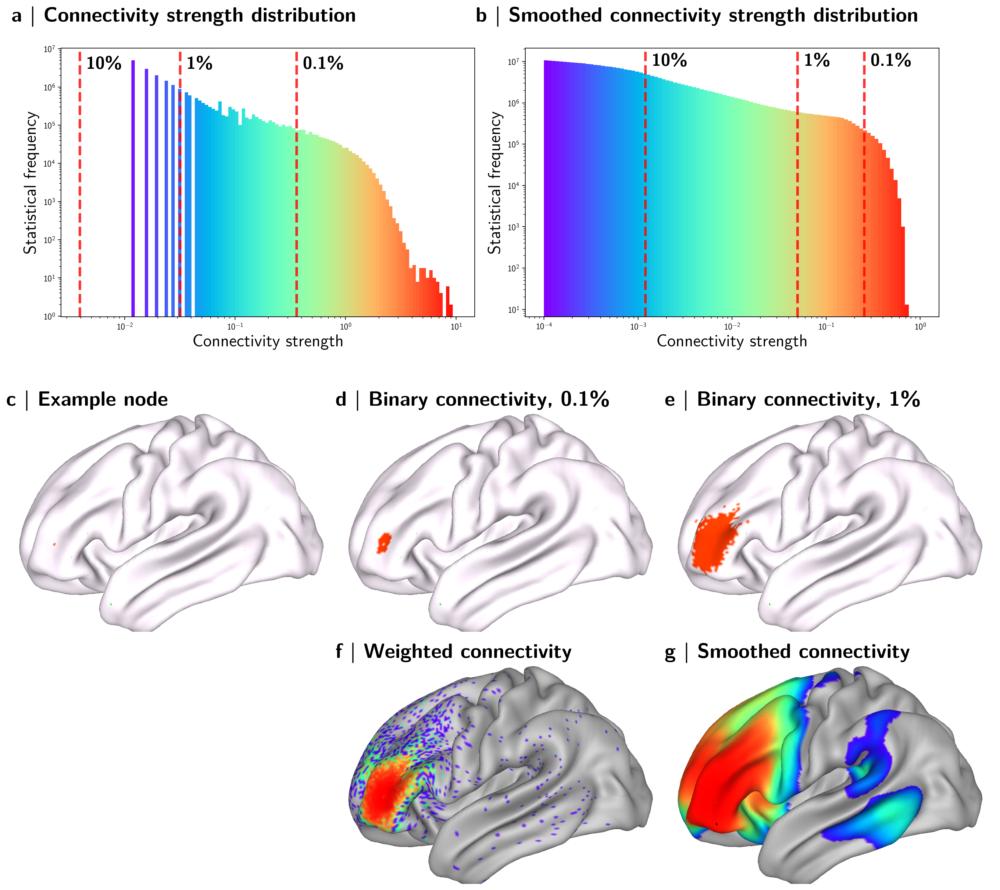

In [76]:
%%time

mycm = LinearSegmentedColormap.from_list(
    'my_gradient',
    (
        (0., (218/255, 166/255, 227/255,)),
        (0.1, (142/255, 65/255, 156/255,)),
        (1., (126/255, 47/255, 140/255,)),
    )
)
mycm = plt.cm.rainbow

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(18, 14))
fig.tight_layout(h_pad=0.)

gs = GridSpec(3, 18, figure=fig, width_ratios=[1]*18, height_ratios=[1.5, 1, 1], wspace=0.0, hspace=0.12, top=0.99, bottom=0.01, left=0.05, right=0.95)
gso = GridSpec(3, 18, figure=fig, width_ratios=[1]*18, height_ratios=[1.5, 1, 1], wspace=40., hspace=0.5, top=0.99, bottom=0.01, left=0.1, right=0.9)

ax = fig.add_subplot(gso[0, :9])
c = our_connectome
hist, edges = np.histogram(c.data, bins=np.logspace(-2, 1, 100));
norm = plt.Normalize(np.log(edges.min()), np.log(edges.max()))
colors = mycm(norm(np.log(edges[:-1])))
ax.bar(edges[:-1], hist, np.diff(edges), color=colors, align="edge")
ax.axvline(thresholds['0.1'], color='r', linestyle='--', alpha=0.8, lw=3)
ax.text(thresholds['0.1'], 3e6, " 10%", weight="bold", fontsize=20)
ax.axvline(thresholds['0.01'], color='r', linestyle='--', alpha=0.8, lw=3)
ax.text(thresholds['0.01'], 3e6, " 1%", weight="bold", fontsize=20)
ax.axvline(thresholds['0.001'], color='r', linestyle='--', alpha=0.8, lw=3)
ax.text(thresholds['0.001'], 3e6, " 0.1%", weight="bold", fontsize=20)
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_ylabel("Statistical frequency", fontsize=20)
ax.set_xlabel("Connectivity strength", fontsize=20)
ax.text(-0.12, 1.1, "a | Connectivity strength distribution", fontsize=24, weight="bold", transform=ax.transAxes)


ax = fig.add_subplot(gso[0, 9:])
c = smoothed_connectome
hist, edges = np.histogram(c.data, bins=np.logspace(-4, -0., 100));
norm = plt.Normalize(np.log(edges.min()), np.log(edges.max()))
colors = mycm(norm(np.log(edges[:-1])))
ax.bar(edges[:-1], hist, np.diff(edges), color=colors, align="edge")
ax.axvline(thresholds['sm_0.1'], color='r', linestyle='--', alpha=0.8, lw=3)
ax.text(thresholds['sm_0.1'], 8e6, " 10%", weight="bold", fontsize=20)
ax.axvline(thresholds['sm_0.01'], color='r', linestyle='--', alpha=0.8, lw=3)
ax.text(thresholds['sm_0.01'], 8e6, " 1%", weight="bold", fontsize=20)
ax.axvline(thresholds['sm_0.001'], color='r', linestyle='--', alpha=0.8, lw=3)
ax.text(thresholds['sm_0.001'], 8e6, " 0.1%", weight="bold", fontsize=20)
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_ylabel("Statistical frequency", fontsize=20)
ax.set_xlabel("Connectivity strength", fontsize=20)
ax.text(-0.12, 1.1, "b | Smoothed connectivity strength distribution", fontsize=24, weight="bold", transform=ax.transAxes)


ax = fig.add_subplot(gs[1, :6])
signal = np.zeros(curvature.shape[0])
signal[10000] = 1
plot_left_surface_with_cerebro(signal, ax, colormap=plt.cm.gist_ncar_r, clims=[0, 3.])
ax.set_title("c | Example node", fontsize=24, loc='left', weight="bold")

ax = fig.add_subplot(gs[1, 6:12])
signal = threshold_connectome(our_connectome[10000], thresholds['0.001']).toarray().ravel()
signal = (signal > 0).astype(float)
plot_left_surface_with_cerebro(signal, ax, colormap=plt.cm.gist_ncar_r, clims=[0, 3.])
ax.set_title("d | Binary connectivity, 0.1%", fontsize=24, loc='left', weight="bold")

ax = fig.add_subplot(gs[1, 12:])
signal = threshold_connectome(our_connectome[10000], thresholds['0.01']).toarray().ravel()
signal = (signal > 0).astype(float)
plot_left_surface_with_cerebro(signal, ax, colormap=plt.cm.gist_ncar_r, clims=[0, 3.])
ax.set_title("e | Binary connectivity, 1%", fontsize=24, loc='left', weight="bold")

ax = fig.add_subplot(gs[2, 6:12])
signal = our_connectome[10000].toarray().ravel()
nonzero = signal > 0
signal = stats.rankdata(signal) / signal.shape[0]
plot_left_surface_with_cerebro(signal, ax, colormap=mycm, clims=[signal[nonzero].min(), signal[nonzero].max()], vlims=[signal[nonzero].min(), 1], exclusion_color=(0.8, 0.8, 0.8, 1))
ax.set_title("f | Weighted connectivity", fontsize=24, loc='left', weight="bold")

ax = fig.add_subplot(gs[2, 12:])
signal = smoothed_connectome[10000].toarray().ravel()
nonzero = signal > 0
signal = stats.rankdata(signal) / signal.shape[0]
plot_left_surface_with_cerebro(signal, ax, colormap=mycm, clims=[signal[nonzero].min(), signal[nonzero].max()], vlims=[signal[nonzero].min(), 1], exclusion_color=(0.8, 0.8, 0.8, 1))
ax.set_title("g | Smoothed connectivity", fontsize=24, loc='left', weight="bold")


### Systematic evaluations

---

The following cells make use of the results form executing the automated systematic evaluation scripts on high-performance computing clusters. If you wish to reproduce this section, make sure to run the relevant scripts first and then store the results in appropriate directories to be used here.


#### Density (with binary connectomes used by Pang et al.)

---



In [ ]:
%%time

# Systematic evaluation for density:
densities = [0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]
binary = True
regression = False
tractography = "pang"
fwhm = 0.
global_local_epsilon= 1.

task_reconstruction_accuracies = {}
for task_contrast in tqdm(task_names, desc="Task contrasts: ", position=0):
    task_reconstruction_accuracies[task_contrast] = {}
    # store geometry to compare
    task_reconstruction_accuracies[task_contrast]['Geometry'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Geometry (Pang et al.) prediction'])
    task_reconstruction_accuracies[task_contrast]['Connectome'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for density in tqdm(densities, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        task_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/task:{task_contrast}_density:{density}_"
            f"binary:{binary}_regression:{regression}_connectome:{tractography}_"
            f"fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        task_reconstruction_accuracies[task_contrast][f'Density: {density*100:g}%'] = np.load(task_reconstruction_accuracy_file)

rest_reconstruction_accuracies = {}
for subject in tqdm(subjects, desc="Subjects: ", position=0):
    rest_reconstruction_accuracies[subject] = {}
    # store geometry to compare
    rest_reconstruction_accuracies[subject]['Geometry'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Geometry (Pang et al.) prediction'])
    rest_reconstruction_accuracies[subject]['Connectome'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for density in tqdm(densities, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        rest_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/rest:{subject}_density:{density}_"
            f"binary:{binary}_regression:{regression}_"
            f"connectome:{tractography}_fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        rest_reconstruction_accuracies[subject][f'Density: {density*100:g}%'] = np.load(rest_reconstruction_accuracy_file)


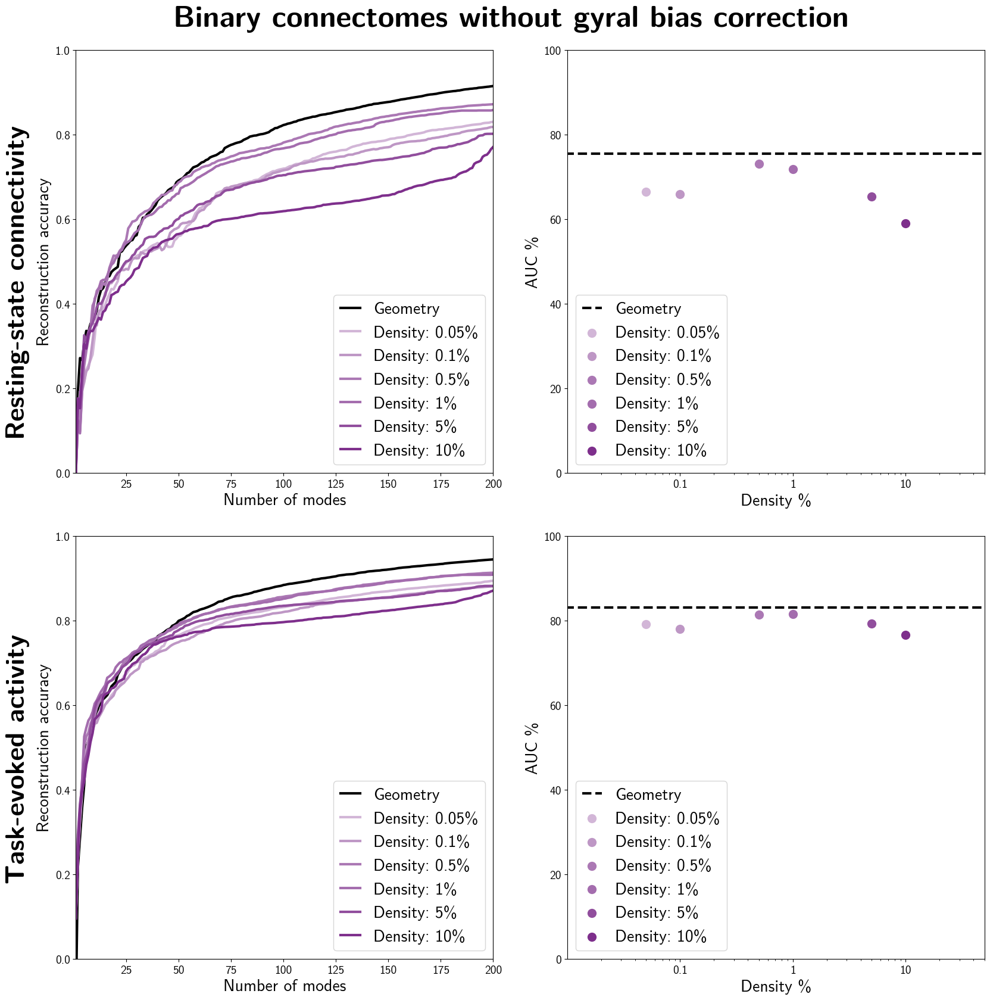

In [521]:
from sklearn.metrics import auc

mycm = LinearSegmentedColormap.from_list(
    'my_gradient',
    (
        (0.0, (1., 1., 1.,)),
        (1., (126/255, 47/255, 140/255,)),
    )
)

line_color_dict = {
    "Geometry": "#000000",
    "Connectome": "#666",
    "Density: 10%": mycm(1.),
    "Density: 5%": mycm(0.85),
    "Density: 1%": mycm(0.7),
    "Density: 0.5%": mycm(0.65),
    "Density: 0.1%": mycm(0.5),
    "Density: 0.05%": mycm(0.35),
}

def task_reconstruction_plot_systematic_1(ax1, ax2, densities, task_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'Density: {density*100:g}%' for density in densities]
    average_task_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_task_reconstruction_accuracies[eigenmode] = np.mean([task_reconstruction_accuracies[key][eigenmode].mean(0) for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_task_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_task_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        0, 100, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for density in densities:
        eigenmode = f'Density: {density*100:g}%'
        eigenmode_auc = auc(np.arange(length), average_task_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            density * 100,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.set_xlim(0.01,50)
    ax2.set_xscale("log")
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("Density %", fontsize=20)
    ax2.set_xticks([0.1, 1, 10])
    ax2.set_xticklabels([0.1, 1, 10])
    ax2.legend(loc="lower left", fontsize=20, handlelength=1.2)


def static_FC_reconstruction_plot_systematic_1(ax1, ax2, densities, rest_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'Density: {density*100:g}%' for density in densities]
    average_rest_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_rest_reconstruction_accuracies[eigenmode] = np.mean([rest_reconstruction_accuracies[key][eigenmode] for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_rest_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_rest_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        0, 100, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for density in densities:
        eigenmode = f'Density: {density*100:g}%'
        eigenmode_auc = auc(np.arange(length), average_rest_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            density * 100,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.set_xlim(0.01,50)
    ax2.set_xscale("log")
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("Density %", fontsize=20)
    ax2.set_xticks([0.1, 1, 10])
    ax2.set_xticklabels([0.1, 1, 10])
    ax2.legend(loc="lower left", fontsize=20, handlelength=1.2)

desired_eigenmodes = ["Geometry", "Connectome"] + [f'Density: {density*100:g}%' for density in densities]

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(16, 16))
fig.suptitle("Binary connectomes without gyral bias correction", fontsize=36, weight='bold', y = 1.04)
fig.text(-0.03, .25, "Task-evoked activity", fontsize=32, weight='bold', va='center', rotation="vertical")
fig.text(-0.03, .75, "Resting-state connectivity", fontsize=32, weight='bold', va='center', rotation="vertical")
gs = GridSpec(2, 2, figure=fig, width_ratios=[1]*2, wspace=0.05, hspace=0.05, top=0.85)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
static_FC_reconstruction_plot_systematic_1(ax1, ax2, densities, rest_reconstruction_accuracies, subjects)
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[1, 1])
task_reconstruction_plot_systematic_1(ax1, ax2, densities, task_reconstruction_accuracies, task_names)


#### Density (with binary connectomes used by Pang et al. after regression of gyral bias)

---



In [ ]:
%%time

# Systematic evaluation for density:
densities = [0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]
binary = True
regression = True
tractography = "pang"
fwhm = 0.
global_local_epsilon= 1.

task_reconstruction_accuracies = {}
for task_contrast in tqdm(task_names, desc="Task contrasts: ", position=0):
    task_reconstruction_accuracies[task_contrast] = {}
    # store geometry to compare
    task_reconstruction_accuracies[task_contrast]['Geometry'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Geometry (Pang et al.) prediction'])
    task_reconstruction_accuracies[task_contrast]['Connectome'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for density in tqdm(densities, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        task_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/task:{task_contrast}_density:{density}_"
            f"binary:{binary}_regression:{regression}_connectome:{tractography}_"
            f"fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        task_reconstruction_accuracies[task_contrast][f'Density: {density*100:g}%'] = np.load(task_reconstruction_accuracy_file)

rest_reconstruction_accuracies = {}
for subject in tqdm(subjects, desc="Subjects: ", position=0):
    rest_reconstruction_accuracies[subject] = {}
    # store geometry to compare
    rest_reconstruction_accuracies[subject]['Geometry'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Geometry (Pang et al.) prediction'])
    rest_reconstruction_accuracies[subject]['Connectome'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for density in tqdm(densities, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        rest_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/rest:{subject}_density:{density}_"
            f"binary:{binary}_regression:{regression}_"
            f"connectome:{tractography}_fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        rest_reconstruction_accuracies[subject][f'Density: {density*100:g}%'] = np.load(rest_reconstruction_accuracy_file)


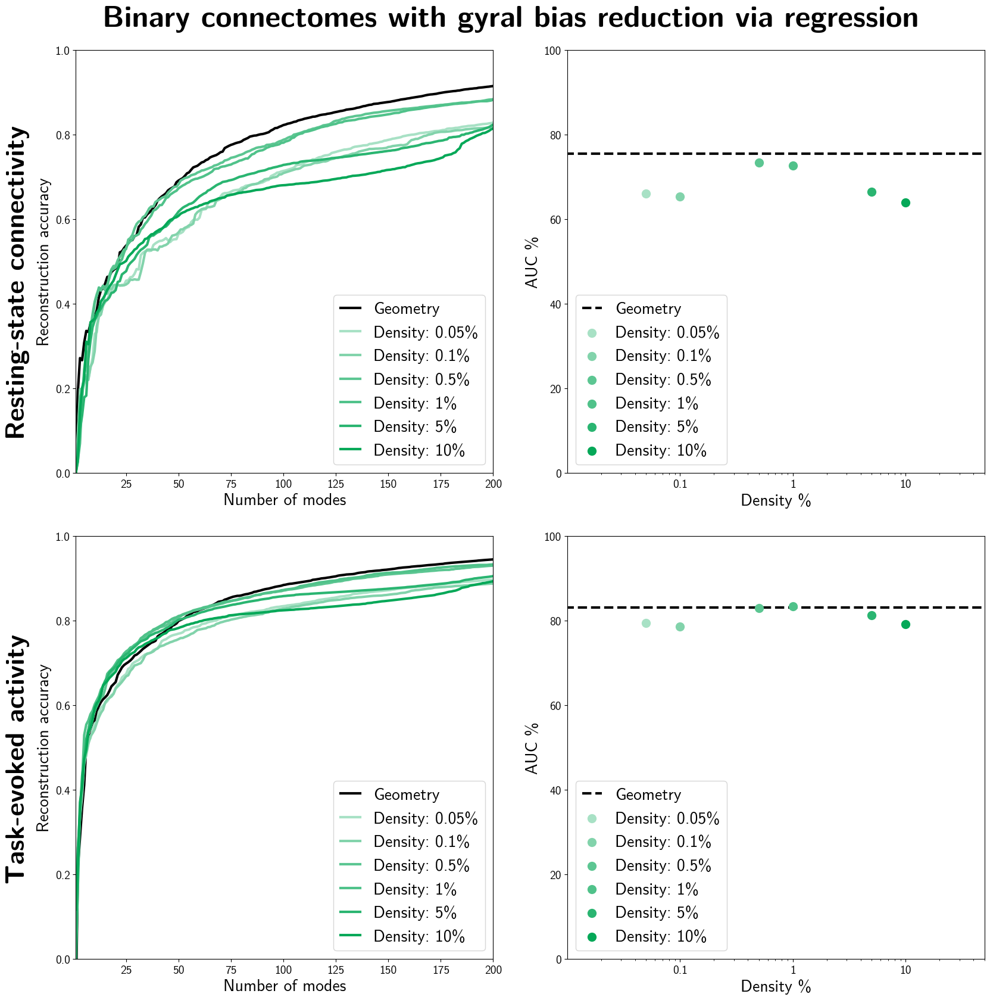

In [526]:
from sklearn.metrics import auc

mycm = LinearSegmentedColormap.from_list(
    'my_gradient',
    (
        (0.0, (1., 1., 1.,)),
        (1., (5/255, 168/255, 88/255,)),
    )
)

line_color_dict = {
    "Geometry": "#000000",
    "Connectome": "#666",
    "Density: 10%": mycm(1.),
    "Density: 5%": mycm(0.85),
    "Density: 1%": mycm(0.7),
    "Density: 0.5%": mycm(0.65),
    "Density: 0.1%": mycm(0.5),
    "Density: 0.05%": mycm(0.35),
}

def task_reconstruction_plot_systematic_1(ax1, ax2, densities, task_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'Density: {density*100:g}%' for density in densities]
    average_task_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_task_reconstruction_accuracies[eigenmode] = np.mean([task_reconstruction_accuracies[key][eigenmode].mean(0) for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_task_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_task_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        0, 100, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for density in densities:
        eigenmode = f'Density: {density*100:g}%'
        eigenmode_auc = auc(np.arange(length), average_task_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            density * 100,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.set_xlim(0.01,50)
    ax2.set_xscale("log")
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("Density %", fontsize=20)
    ax2.set_xticks([0.1, 1, 10])
    ax2.set_xticklabels([0.1, 1, 10])
    ax2.legend(loc="lower left", fontsize=20, handlelength=1.2)


def static_FC_reconstruction_plot_systematic_1(ax1, ax2, densities, rest_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'Density: {density*100:g}%' for density in densities]
    average_rest_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_rest_reconstruction_accuracies[eigenmode] = np.mean([rest_reconstruction_accuracies[key][eigenmode] for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_rest_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_rest_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        0, 100, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for density in densities:
        eigenmode = f'Density: {density*100:g}%'
        eigenmode_auc = auc(np.arange(length), average_rest_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            density * 100,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.set_xlim(0.01,50)
    ax2.set_xscale("log")
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("Density %", fontsize=20)
    ax2.set_xticks([0.1, 1, 10])
    ax2.set_xticklabels([0.1, 1, 10])
    ax2.legend(loc="lower left", fontsize=20, handlelength=1.2)

desired_eigenmodes = ["Geometry", "Connectome"] + [f'Density: {density*100:g}%' for density in densities]

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(16, 16))
fig.suptitle("Binary connectomes with gyral bias reduction via regression", fontsize=36, weight='bold', y = 1.04)
fig.text(-0.03, .25, "Task-evoked activity", fontsize=32, weight='bold', va='center', rotation="vertical")
fig.text(-0.03, .75, "Resting-state connectivity", fontsize=32, weight='bold', va='center', rotation="vertical")
gs = GridSpec(2, 2, figure=fig, width_ratios=[1]*2, wspace=0.05, hspace=0.05, top=0.85)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
static_FC_reconstruction_plot_systematic_1(ax1, ax2, densities, rest_reconstruction_accuracies, subjects)
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[1, 1])
task_reconstruction_plot_systematic_1(ax1, ax2, densities, task_reconstruction_accuracies, task_names)


### Density (with our binary connectomes)

---



In [ ]:
%%time

# Systematic evaluation for density:
densities = [0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]
binary = True
regression = False
tractography = "our"
fwhm = 0.
global_local_epsilon= 1.

task_reconstruction_accuracies = {}
for task_contrast in tqdm(task_names, desc="Task contrasts: ", position=0):
    task_reconstruction_accuracies[task_contrast] = {}
    # store geometry to compare
    task_reconstruction_accuracies[task_contrast]['Geometry'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Geometry (Pang et al.) prediction'])
    task_reconstruction_accuracies[task_contrast]['Connectome'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for density in tqdm(densities, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        task_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/task:{task_contrast}_density:{density}_"
            f"binary:{binary}_regression:{regression}_connectome:{tractography}_"
            f"fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        task_reconstruction_accuracies[task_contrast][f'Density: {density*100:g}%'] = np.load(task_reconstruction_accuracy_file)

rest_reconstruction_accuracies = {}
for subject in tqdm(subjects, desc="Subjects: ", position=0):
    rest_reconstruction_accuracies[subject] = {}
    # store geometry to compare
    rest_reconstruction_accuracies[subject]['Geometry'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Geometry (Pang et al.) prediction'])
    rest_reconstruction_accuracies[subject]['Connectome'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for density in tqdm(densities, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        rest_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/rest:{subject}_density:{density}_"
            f"binary:{binary}_regression:{regression}_"
            f"connectome:{tractography}_fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        rest_reconstruction_accuracies[subject][f'Density: {density*100:g}%'] = np.load(rest_reconstruction_accuracy_file)


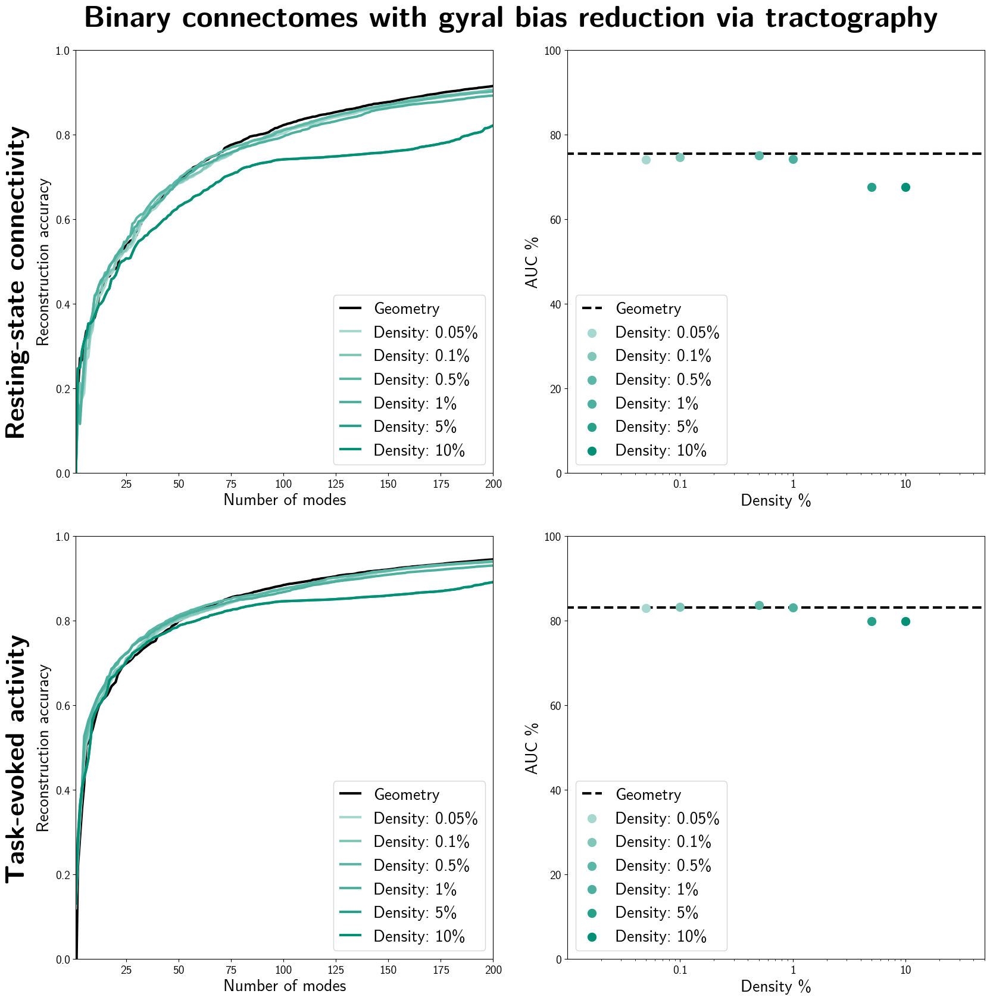

In [528]:
from sklearn.metrics import auc

mycm = LinearSegmentedColormap.from_list(
    'my_gradient',
    (
        (0.0, (1., 1., 1.,)),
        (1., (1/255, 143/255, 117/255,)),
    )
)

line_color_dict = {
    "Geometry": "#000000",
    "Connectome": "#666",
    "Density: 10%": mycm(1.),
    "Density: 5%": mycm(0.85),
    "Density: 1%": mycm(0.7),
    "Density: 0.5%": mycm(0.65),
    "Density: 0.1%": mycm(0.5),
    "Density: 0.05%": mycm(0.35),
}

def task_reconstruction_plot_systematic_1(ax1, ax2, densities, task_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'Density: {density*100:g}%' for density in densities]
    average_task_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_task_reconstruction_accuracies[eigenmode] = np.mean([task_reconstruction_accuracies[key][eigenmode].mean(0) for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_task_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_task_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        0, 100, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for density in densities:
        eigenmode = f'Density: {density*100:g}%'
        eigenmode_auc = auc(np.arange(length), average_task_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            density * 100,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.set_xlim(0.01,50)
    ax2.set_xscale("log")
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("Density %", fontsize=20)
    ax2.set_xticks([0.1, 1, 10])
    ax2.set_xticklabels([0.1, 1, 10])
    ax2.legend(loc="lower left", fontsize=20, handlelength=1.2)


def static_FC_reconstruction_plot_systematic_1(ax1, ax2, densities, rest_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'Density: {density*100:g}%' for density in densities]
    average_rest_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_rest_reconstruction_accuracies[eigenmode] = np.mean([rest_reconstruction_accuracies[key][eigenmode] for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_rest_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_rest_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        0, 100, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for density in densities:
        eigenmode = f'Density: {density*100:g}%'
        eigenmode_auc = auc(np.arange(length), average_rest_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            density * 100,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.set_xlim(0.01,50)
    ax2.set_xscale("log")
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("Density %", fontsize=20)
    ax2.set_xticks([0.1, 1, 10])
    ax2.set_xticklabels([0.1, 1, 10])
    ax2.legend(loc="lower left", fontsize=20, handlelength=1.2)

desired_eigenmodes = ["Geometry", "Connectome"] + [f'Density: {density*100:g}%' for density in densities]

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(16, 16))
fig.suptitle("Binary connectomes with gyral bias reduction via tractography", fontsize=36, weight='bold', y = 1.04)
fig.text(-0.03, .25, "Task-evoked activity", fontsize=32, weight='bold', va='center', rotation="vertical")
fig.text(-0.03, .75, "Resting-state connectivity", fontsize=32, weight='bold', va='center', rotation="vertical")
gs = GridSpec(2, 2, figure=fig, width_ratios=[1]*2, wspace=0.05, hspace=0.05, top=0.85)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
static_FC_reconstruction_plot_systematic_1(ax1, ax2, densities, rest_reconstruction_accuracies, subjects)
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[1, 1])
task_reconstruction_plot_systematic_1(ax1, ax2, densities, task_reconstruction_accuracies, task_names)


### Smoothing for our binary connectomes

---



In [ ]:
%%time

# Systematic evaluation for density:
# densities = [0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]
density = 0.01
binary = True
regression = False
tractography = "our"
fwhms = [0., 2., 4., 6., 8., 10.,]
global_local_epsilon= 1.

task_reconstruction_accuracies = {}
for task_contrast in tqdm(task_names, desc="Task contrasts: ", position=0):
    task_reconstruction_accuracies[task_contrast] = {}
    # store geometry to compare
    task_reconstruction_accuracies[task_contrast]['Geometry'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Geometry (Pang et al.) prediction'])
    task_reconstruction_accuracies[task_contrast]['Connectome'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for fwhm in tqdm(fwhms, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        task_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/task:{task_contrast}_density:{density}_"
            f"binary:{binary}_regression:{regression}_connectome:{tractography}_"
            f"fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        task_reconstruction_accuracies[task_contrast][f'FWHM: {int(fwhm)}mm'] = np.load(task_reconstruction_accuracy_file)

rest_reconstruction_accuracies = {}
for subject in tqdm(subjects, desc="Subjects: ", position=0):
    rest_reconstruction_accuracies[subject] = {}
    # store geometry to compare
    rest_reconstruction_accuracies[subject]['Geometry'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Geometry (Pang et al.) prediction'])
    rest_reconstruction_accuracies[subject]['Connectome'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for fwhm in tqdm(fwhms, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        rest_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/rest:{subject}_density:{density}_"
            f"binary:{binary}_regression:{regression}_"
            f"connectome:{tractography}_fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        rest_reconstruction_accuracies[subject][f'FWHM: {int(fwhm)}mm'] = np.load(rest_reconstruction_accuracy_file)


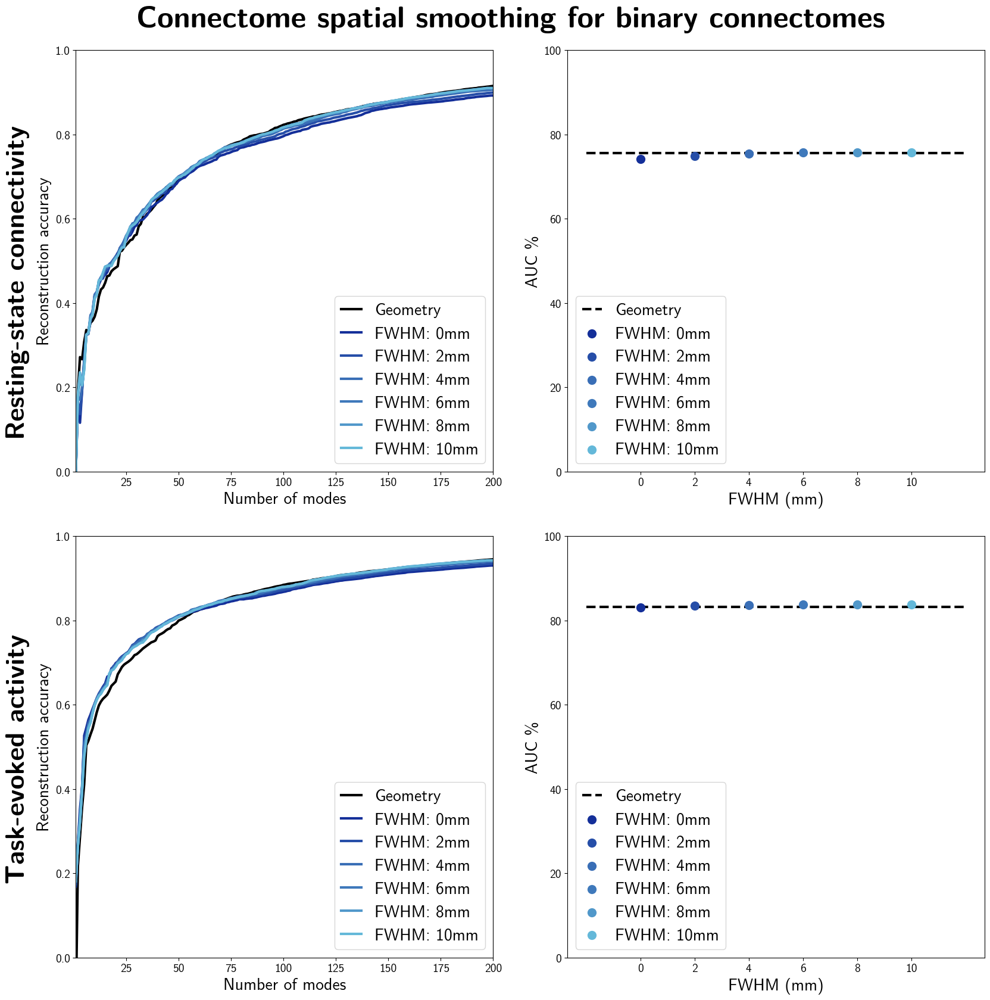

In [533]:
from sklearn.metrics import auc

mycm = LinearSegmentedColormap.from_list(
    'my_gradient',
    (
        (0., (100/255, 184/255, 217/255,)),
        (0.35, (100/255, 184/255, 217/255,)),
        (1., (20/255, 47/255, 153/255,)),
    )
)

line_color_dict = {
    "Geometry": "#000000",
    "Connectome": "#666",
    "FWHM: 0mm": mycm(1.),
    "FWHM: 2mm": mycm(0.85),
    "FWHM: 4mm": mycm(0.7),
    "FWHM: 6mm": mycm(0.65),
    "FWHM: 8mm": mycm(0.5),
    "FWHM: 10mm": mycm(0.35),
}

def task_reconstruction_plot_systematic_1(ax1, ax2, fwhms, task_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'FWHM: {int(fwhm)}mm' for fwhm in fwhms]
    average_task_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_task_reconstruction_accuracies[eigenmode] = np.mean([task_reconstruction_accuracies[key][eigenmode].mean(0) for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_task_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_task_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        -2, 12, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for fwhm in fwhms:
        eigenmode = f'FWHM: {int(fwhm)}mm'
        eigenmode_auc = auc(np.arange(length), average_task_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            fwhm,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("FWHM (mm)", fontsize=20)
    ax2.set_xticks([int(x) for x in fwhms])
    ax2.legend(loc="lower left", fontsize=20, handlelength=1.2)


def static_FC_reconstruction_plot_systematic_1(ax1, ax2, fwhms, rest_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'FWHM: {int(fwhm)}mm' for fwhm in fwhms]
    average_rest_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_rest_reconstruction_accuracies[eigenmode] = np.mean([rest_reconstruction_accuracies[key][eigenmode] for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_rest_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_rest_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        -2, 12, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for fwhm in fwhms:
        eigenmode = f'FWHM: {int(fwhm)}mm'
        eigenmode_auc = auc(np.arange(length), average_rest_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            fwhm,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("FWHM (mm)", fontsize=20)
    ax2.set_xticks([int(x) for x in fwhms])
    ax2.legend(loc="lower left", fontsize=20, handlelength=1.2)

desired_eigenmodes = ["Geometry", "Connectome"] + [f'FWHM: {int(fwhm)}mm' for fwhm in fwhms]

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(16, 16))
fig.suptitle("Connectome spatial smoothing for binary connectomes", fontsize=36, weight='bold', y = 1.04)
fig.text(-0.03, .25, "Task-evoked activity", fontsize=32, weight='bold', va='center', rotation="vertical")
fig.text(-0.03, .75, "Resting-state connectivity", fontsize=32, weight='bold', va='center', rotation="vertical")
gs = GridSpec(2, 2, figure=fig, width_ratios=[1]*2, wspace=0.05, hspace=0.05, top=0.85)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
static_FC_reconstruction_plot_systematic_1(ax1, ax2, fwhms, rest_reconstruction_accuracies, subjects)
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[1, 1])
task_reconstruction_plot_systematic_1(ax1, ax2, fwhms, task_reconstruction_accuracies, task_names)


### Smoothing for our weighted connectomes

---



In [ ]:
%%time

# Systematic evaluation for density:
density = 0.1
binary = False
regression = False
tractography = "our"
fwhms = [0., 2., 4., 6., 8., 10.,]
global_local_epsilon= 1e-6

task_reconstruction_accuracies = {}
for task_contrast in tqdm(task_names, desc="Task contrasts: ", position=0):
    task_reconstruction_accuracies[task_contrast] = {}
    # store geometry to compare
    task_reconstruction_accuracies[task_contrast]['Geometry'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Geometry (Pang et al.) prediction'])
    task_reconstruction_accuracies[task_contrast]['Connectome'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for fwhm in tqdm(fwhms, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        task_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/task:{task_contrast}_density:{density}_"
            f"binary:{binary}_regression:{regression}_connectome:{tractography}_"
            f"fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        task_reconstruction_accuracies[task_contrast][f'FWHM: {int(fwhm)}mm'] = np.load(task_reconstruction_accuracy_file)

rest_reconstruction_accuracies = {}
for subject in tqdm(subjects, desc="Subjects: ", position=0):
    rest_reconstruction_accuracies[subject] = {}
    # store geometry to compare
    rest_reconstruction_accuracies[subject]['Geometry'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Geometry (Pang et al.) prediction'])
    rest_reconstruction_accuracies[subject]['Connectome'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for fwhm in tqdm(fwhms, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        rest_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/rest:{subject}_density:{density}_"
            f"binary:{binary}_regression:{regression}_"
            f"connectome:{tractography}_fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        rest_reconstruction_accuracies[subject][f'FWHM: {int(fwhm)}mm'] = np.load(rest_reconstruction_accuracy_file)


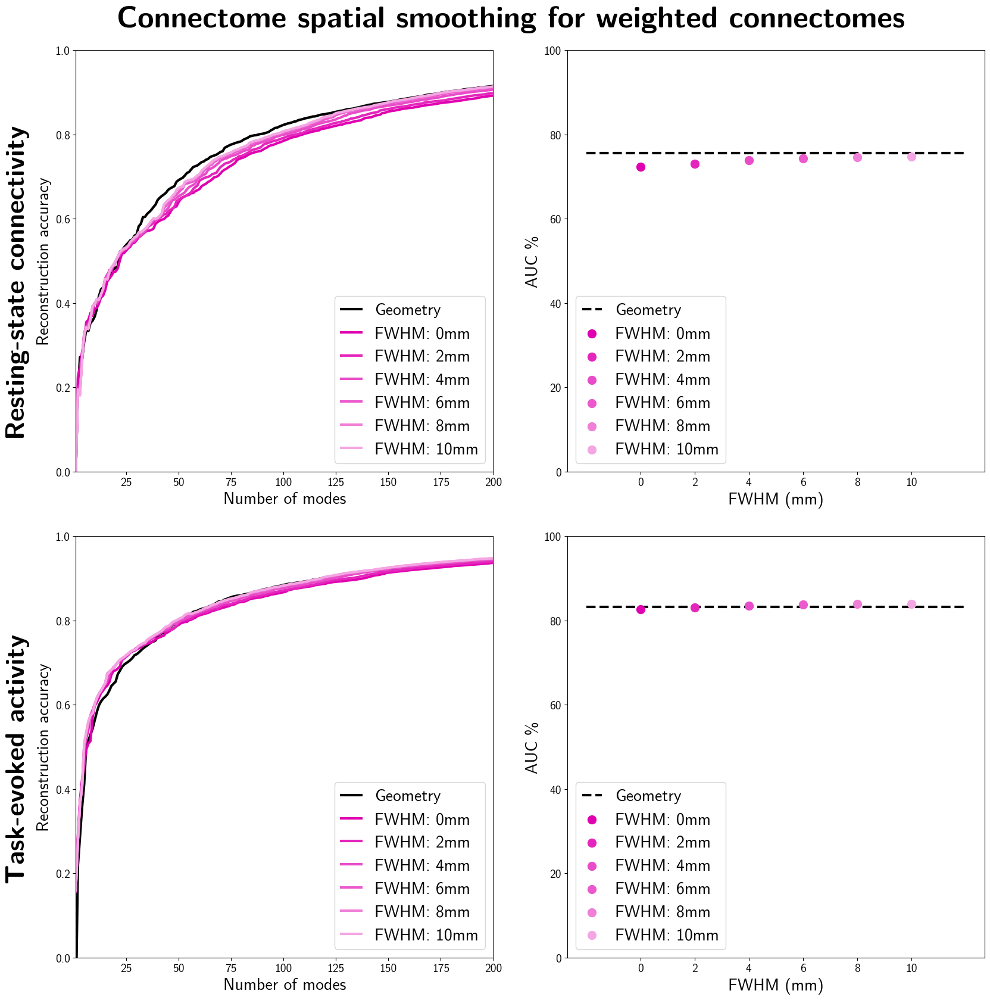

In [535]:
from sklearn.metrics import auc

mycm = LinearSegmentedColormap.from_list(
    'my_gradient',
    (
        (0.0, (1., 1., 1.,)),
        (1., (224/255, 0/255, 176/255,)),
    )
)

line_color_dict = {
    "Geometry": "#000000",
    "Connectome": "#666",
    "FWHM: 0mm": mycm(1.),
    "FWHM: 2mm": mycm(0.85),
    "FWHM: 4mm": mycm(0.7),
    "FWHM: 6mm": mycm(0.65),
    "FWHM: 8mm": mycm(0.5),
    "FWHM: 10mm": mycm(0.35),
}

def task_reconstruction_plot_systematic_1(ax1, ax2, fwhms, task_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'FWHM: {int(fwhm)}mm' for fwhm in fwhms]
    average_task_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_task_reconstruction_accuracies[eigenmode] = np.mean([task_reconstruction_accuracies[key][eigenmode].mean(0) for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_task_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_task_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        -2, 12, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for fwhm in fwhms:
        eigenmode = f'FWHM: {int(fwhm)}mm'
        eigenmode_auc = auc(np.arange(length), average_task_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            fwhm,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("FWHM (mm)", fontsize=20)
    ax2.set_xticks([int(x) for x in fwhms])
    ax2.legend(loc="lower left", fontsize=20, handlelength=1.2)


def static_FC_reconstruction_plot_systematic_1(ax1, ax2, fwhms, rest_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'FWHM: {int(fwhm)}mm' for fwhm in fwhms]
    average_rest_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_rest_reconstruction_accuracies[eigenmode] = np.mean([rest_reconstruction_accuracies[key][eigenmode] for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_rest_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_rest_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        -2, 12, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for fwhm in fwhms:
        eigenmode = f'FWHM: {int(fwhm)}mm'
        eigenmode_auc = auc(np.arange(length), average_rest_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            fwhm,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("FWHM (mm)", fontsize=20)
    ax2.set_xticks([int(x) for x in fwhms])
    ax2.legend(loc="lower left", fontsize=20, handlelength=1.2)

desired_eigenmodes = ["Geometry", "Connectome"] + [f'FWHM: {int(fwhm)}mm' for fwhm in fwhms]

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(16, 16))
fig.suptitle("Connectome spatial smoothing for weighted connectomes", fontsize=36, weight='bold', y = 1.04)
fig.text(-0.03, .25, "Task-evoked activity", fontsize=32, weight='bold', va='center', rotation="vertical")
fig.text(-0.03, .75, "Resting-state connectivity", fontsize=32, weight='bold', va='center', rotation="vertical")
gs = GridSpec(2, 2, figure=fig, width_ratios=[1]*2, wspace=0.05, hspace=0.05, top=0.85)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
static_FC_reconstruction_plot_systematic_1(ax1, ax2, fwhms, rest_reconstruction_accuracies, subjects)
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[1, 1])
task_reconstruction_plot_systematic_1(ax1, ax2, fwhms, task_reconstruction_accuracies, task_names)


### Density (with our weighted smoothed connectomes)

---



In [ ]:
%%time

# Systematic evaluation for density:
densities = [0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]
binary = False
regression = False
tractography = "our"
fwhm = 8.
global_local_epsilon= 1e-6

task_reconstruction_accuracies = {}
for task_contrast in tqdm(task_names, desc="Task contrasts: ", position=0):
    task_reconstruction_accuracies[task_contrast] = {}
    # store geometry to compare
    task_reconstruction_accuracies[task_contrast]['Geometry'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Geometry (Pang et al.) prediction'])
    task_reconstruction_accuracies[task_contrast]['Connectome'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for density in tqdm(densities, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        task_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/task:{task_contrast}_density:{density}_"
            f"binary:{binary}_regression:{regression}_connectome:{tractography}_"
            f"fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        task_reconstruction_accuracies[task_contrast][f'Density: {density*100:g}%'] = np.load(task_reconstruction_accuracy_file)

rest_reconstruction_accuracies = {}
for subject in tqdm(subjects, desc="Subjects: ", position=0):
    rest_reconstruction_accuracies[subject] = {}
    # store geometry to compare
    rest_reconstruction_accuracies[subject]['Geometry'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Geometry (Pang et al.) prediction'])
    rest_reconstruction_accuracies[subject]['Connectome'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for density in tqdm(densities, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        rest_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/rest:{subject}_density:{density}_"
            f"binary:{binary}_regression:{regression}_"
            f"connectome:{tractography}_fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        rest_reconstruction_accuracies[subject][f'Density: {density*100:g}%'] = np.load(rest_reconstruction_accuracy_file)


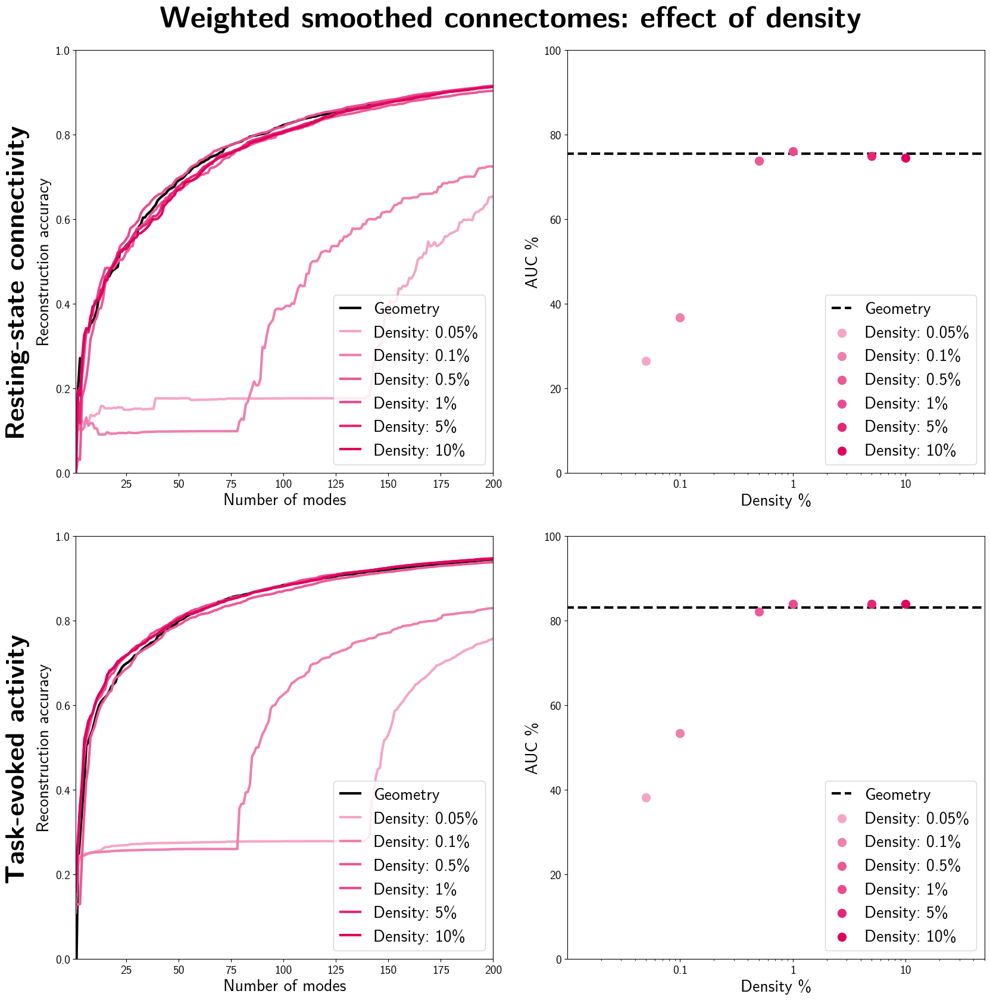

In [538]:
from sklearn.metrics import auc

mycm = LinearSegmentedColormap.from_list(
    'my_gradient',
    (
        (0.0, (1., 1., 1.,)),
        (1., (224/255, 0/255, 94/255,)),
    )
)

line_color_dict = {
    "Geometry": "#000000",
    "Connectome": "#666",
    "Density: 10%": mycm(1.),
    "Density: 5%": mycm(0.85),
    "Density: 1%": mycm(0.7),
    "Density: 0.5%": mycm(0.65),
    "Density: 0.1%": mycm(0.5),
    "Density: 0.05%": mycm(0.35),
}

def task_reconstruction_plot_systematic_1(ax1, ax2, densities, task_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'Density: {density*100:g}%' for density in densities]
    average_task_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_task_reconstruction_accuracies[eigenmode] = np.mean([task_reconstruction_accuracies[key][eigenmode].mean(0) for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_task_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_task_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        0, 100, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for density in densities:
        eigenmode = f'Density: {density*100:g}%'
        eigenmode_auc = auc(np.arange(length), average_task_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            density * 100,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.set_xlim(0.01,50)
    ax2.set_xscale("log")
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("Density %", fontsize=20)
    ax2.set_xticks([0.1, 1, 10])
    ax2.set_xticklabels([0.1, 1, 10])
    ax2.legend(loc="lower right", fontsize=20, handlelength=1.2)


def static_FC_reconstruction_plot_systematic_1(ax1, ax2, densities, rest_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'Density: {density*100:g}%' for density in densities]
    average_rest_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_rest_reconstruction_accuracies[eigenmode] = np.mean([rest_reconstruction_accuracies[key][eigenmode] for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_rest_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_rest_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        0, 100, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for density in densities:
        eigenmode = f'Density: {density*100:g}%'
        eigenmode_auc = auc(np.arange(length), average_rest_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            density * 100,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.set_xlim(0.01,50)
    ax2.set_xscale("log")
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("Density %", fontsize=20)
    ax2.set_xticks([0.1, 1, 10])
    ax2.set_xticklabels([0.1, 1, 10])
    ax2.legend(loc="lower right", fontsize=20, handlelength=1.2)

desired_eigenmodes = ["Geometry", "Connectome"] + [f'Density: {density*100:g}%' for density in densities]

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(16, 16))
fig.suptitle("Weighted smoothed connectomes: effect of density", fontsize=36, weight='bold', y = 1.04)
fig.text(-0.03, .25, "Task-evoked activity", fontsize=32, weight='bold', va='center', rotation="vertical")
fig.text(-0.03, .75, "Resting-state connectivity", fontsize=32, weight='bold', va='center', rotation="vertical")
gs = GridSpec(2, 2, figure=fig, width_ratios=[1]*2, wspace=0.05, hspace=0.05, top=0.85)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
static_FC_reconstruction_plot_systematic_1(ax1, ax2, densities, rest_reconstruction_accuracies, subjects)
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[1, 1])
task_reconstruction_plot_systematic_1(ax1, ax2, densities, task_reconstruction_accuracies, task_names)


### $\varepsilon_{local}$ (with our weighted smoothed connectomes)

---



In [ ]:
%%time

# Systematic evaluation for density:
density = 0.1
binary = False
regression = False
tractography = "our"
fwhm = 8.
global_local_epsilons= [1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1.]

task_reconstruction_accuracies = {}
for task_contrast in tqdm(task_names, desc="Task contrasts: ", position=0):
    task_reconstruction_accuracies[task_contrast] = {}
    # store geometry to compare
    task_reconstruction_accuracies[task_contrast]['Geometry'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Geometry (Pang et al.) prediction'])
    task_reconstruction_accuracies[task_contrast]['Connectome'] = np.array(subject_reconstruction_accuracies_atlas[task_contrast]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for global_local_epsilon in tqdm(global_local_epsilons, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        task_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/task:{task_contrast}_density:{density}_"
            f"binary:{binary}_regression:{regression}_connectome:{tractography}_"
            f"fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        task_reconstruction_accuracies[task_contrast][f'$\\varepsilon$: {global_local_epsilon:g}'] = np.load(task_reconstruction_accuracy_file)

rest_reconstruction_accuracies = {}
for subject in tqdm(subjects, desc="Subjects: ", position=0):
    rest_reconstruction_accuracies[subject] = {}
    # store geometry to compare
    rest_reconstruction_accuracies[subject]['Geometry'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Geometry (Pang et al.) prediction'])
    rest_reconstruction_accuracies[subject]['Connectome'] = np.array(subject_static_FC_reconstruction_accuracies_rest[subject]['Connectome (Pang et al.)'])
    # add connectomes at different densities
    for global_local_epsilon in tqdm(global_local_epsilons, desc="Densities: ", position=1, leave=False):
        parameters = (density, binary, regression, tractography, fwhm, global_local_epsilon)
        rest_reconstruction_accuracy_file = (
            f"{main_dir}/reconstruction_accuracy/rest:{subject}_density:{density}_"
            f"binary:{binary}_regression:{regression}_"
            f"connectome:{tractography}_fwhm:{fwhm}_local:{global_local_epsilon}.npy"
        )
        rest_reconstruction_accuracies[subject][f'$\\varepsilon$: {global_local_epsilon:g}'] = np.load(rest_reconstruction_accuracy_file)


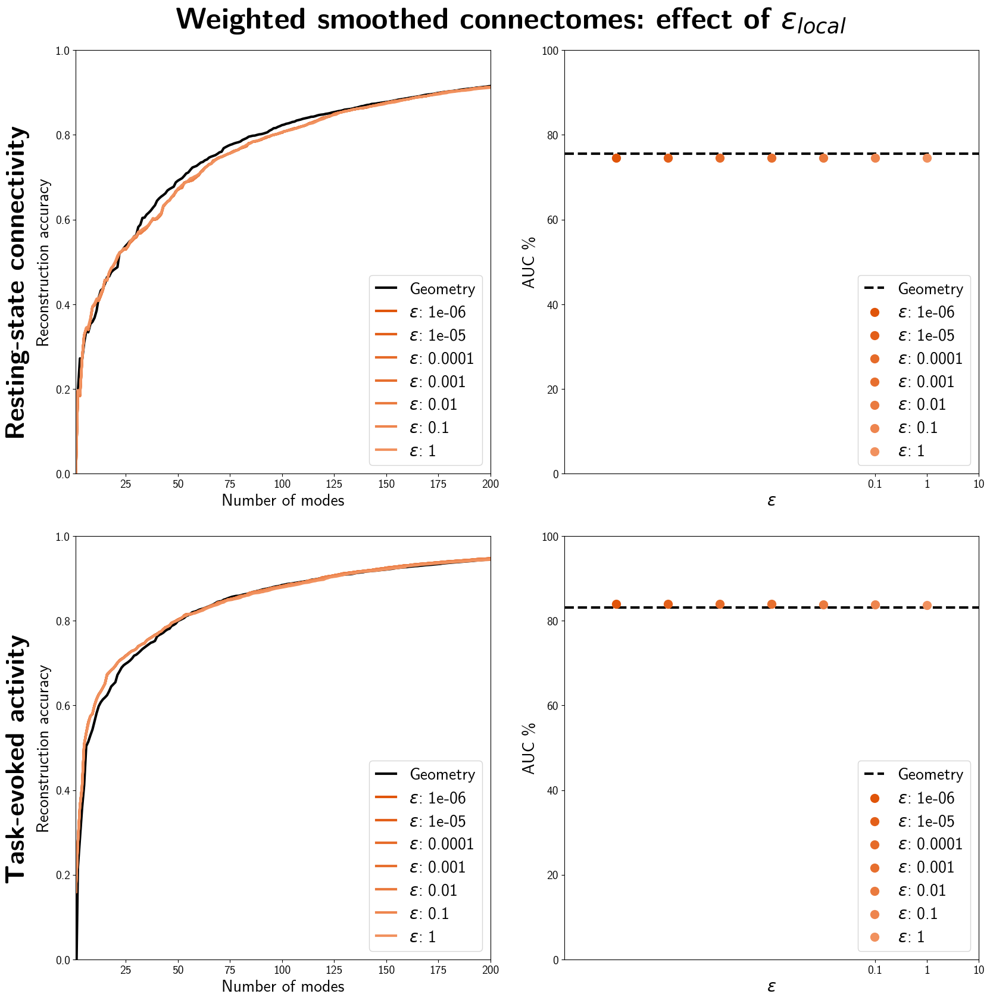

In [541]:
from sklearn.metrics import auc

mycm = LinearSegmentedColormap.from_list(
    'my_gradient',
    (
        (0., (245/255, 160/255, 115/255,)),
        (1., (224/255, 84/255, 9/255,)),
    )
)

line_color_dict = {
    "Geometry": "#000000",
    "Connectome": "#666",
    f"$\\varepsilon$: {1e-6:g}": mycm(1.),
    f"$\\varepsilon$: {1e-5:g}": mycm(0.85),
    f"$\\varepsilon$: {1e-4:g}": mycm(0.7),
    f"$\\varepsilon$: {1e-3:g}": mycm(0.65),
    f"$\\varepsilon$: {1e-2:g}": mycm(0.5),
    f"$\\varepsilon$: {1e-1:g}": mycm(0.35),
    f"$\\varepsilon$: {1:g}": mycm(0.2),
}

def task_reconstruction_plot_systematic_1(ax1, ax2, densities, task_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'$\\varepsilon$: {global_local_epsilon:g}' for global_local_epsilon in global_local_epsilons]
    average_task_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_task_reconstruction_accuracies[eigenmode] = np.mean([task_reconstruction_accuracies[key][eigenmode].mean(0) for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_task_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_task_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        0, 100, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for global_local_epsilon in global_local_epsilons:
        eigenmode = f'$\\varepsilon$: {global_local_epsilon:g}'
        eigenmode_auc = auc(np.arange(length), average_task_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            global_local_epsilon,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.set_xlim(1e-7,10)
    ax2.set_xscale("log")
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("$\\varepsilon$", fontsize=20)
    ax2.set_xticks([0.1, 1, 10])
    ax2.set_xticklabels([0.1, 1, 10])
    ax2.legend(loc="lower right", fontsize=20, handlelength=1.2)


def static_FC_reconstruction_plot_systematic_1(ax1, ax2, densities, rest_reconstruction_accuracies, keys, length=200):
    desired_eigenmodes = ["Geometry"] + [f'$\\varepsilon$: {global_local_epsilon:g}' for global_local_epsilon in global_local_epsilons]
    average_rest_reconstruction_accuracies = {}
    for eigenmode in desired_eigenmodes:
        average_rest_reconstruction_accuracies[eigenmode] = np.mean([rest_reconstruction_accuracies[key][eigenmode] for key in keys], 0)
        ax1.plot(
            1+np.arange(length),
            average_rest_reconstruction_accuracies[eigenmode][:length],
            label=eigenmode,
            lw=3,
            c=line_color_dict.get(eigenmode, "#AAA"),
        )
    g_auc = auc(np.arange(length), average_rest_reconstruction_accuracies["Geometry"][:length]) / length
    ax2.hlines(
        100 * g_auc,
        0, 100, colors=[(0, 0, 0)],
        label="Geometry",
        lw=3,
        linestyles="dashed",
    )
    for global_local_epsilon in global_local_epsilons:
        eigenmode = f'$\\varepsilon$: {global_local_epsilon:g}'
        eigenmode_auc = auc(np.arange(length), average_rest_reconstruction_accuracies[eigenmode][:length]) / length
        ax2.scatter(
            global_local_epsilon,
            eigenmode_auc * 100,
            label=eigenmode,
            color=line_color_dict.get(eigenmode, "#AAA"),
            s=100,
            zorder=20,
        )

    ax1.set_ylim(0,1.)
    ax1.set_xlim(1,length)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.legend(loc="lower right", fontsize=20, handlelength=1.2)
    ax1.set_ylabel("Reconstruction accuracy", fontsize=20)
    ax1.set_xlabel("Number of modes", fontsize=20)
    
    ax2.set_ylim(0,100)
    ax2.set_xlim(1e-7,10)
    ax2.set_xscale("log")
    ax2.tick_params(axis='both', labelsize=14)
    ax2.set_ylabel("AUC %", fontsize=20)
    ax2.set_xlabel("$\\varepsilon$", fontsize=20)
    ax2.set_xticks([0.1, 1, 10])
    ax2.set_xticklabels([0.1, 1, 10])
    ax2.legend(loc="lower right", fontsize=20, handlelength=1.2)

desired_eigenmodes = ["Geometry", "Connectome"] + [f'$\\varepsilon$: {global_local_epsilon:g}' for density in densities]

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(16, 16))
fig.suptitle("Weighted smoothed connectomes: effect of $\\varepsilon_{local}$", fontsize=36, weight='bold', y = 1.04)
fig.text(-0.03, .25, "Task-evoked activity", fontsize=32, weight='bold', va='center', rotation="vertical")
fig.text(-0.03, .75, "Resting-state connectivity", fontsize=32, weight='bold', va='center', rotation="vertical")
gs = GridSpec(2, 2, figure=fig, width_ratios=[1]*2, wspace=0.05, hspace=0.05, top=0.85)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
static_FC_reconstruction_plot_systematic_1(ax1, ax2, densities, rest_reconstruction_accuracies, subjects)
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[1, 1])
task_reconstruction_plot_systematic_1(ax1, ax2, densities, task_reconstruction_accuracies, task_names)


### Procrustes evaluation

---

The following cells make use of the results form executing the Matlab scripts for Procrustes evaluation. If you wish to reproduce this section, make sure to run the relevant scripts first and then store the results in appropriate directories to be used here.


In [ ]:
# load results from the matlab script

procrustes_results = sio.loadmat(f"{data_dir}/eigenmodes/matlab/procrustes_results.mat")


In [48]:
procrustes_dict = {}

procrustes_dict['pairs'] = [x[0][0] for x in procrustes_results['Pairs']]

procrustes_dict['Number of modes'] = np.array(procrustes_results['HowManyModes'][0])

procrustes_dict['pre procrustes residuals'] = np.array([x[0][:,0] for x in procrustes_results['E0_pairs']])
procrustes_dict['post procrustes residuals'] = np.array([x[0][:,0] for x in procrustes_results['E_pairs']])


In [58]:
pairs_names = {
    '01-vs-02': 'Geometry vs. EDR',
    '01-vs-03': 'Geometry vs. Connectome (Pang et al.)',
    '01-vs-04': 'Geometry vs. Our connectome',
}

index_names = {
    0: 'Geometry',
    1: 'EDR',
    2: 'Connectome (Pang et al.)',
    3: 'Our connectome',
}


(0.0, 200.0)

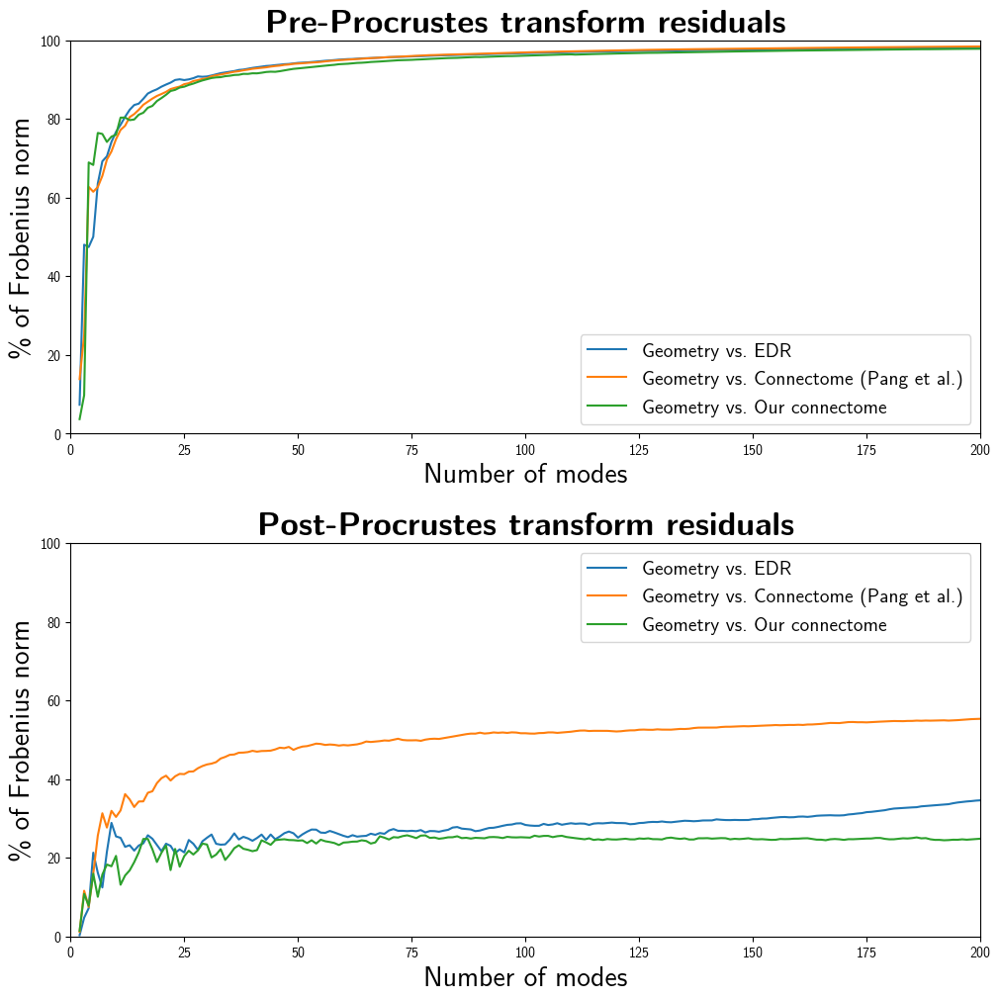

In [74]:
mpl.rcParams['font.family'] = 'Latin Modern Sans'

fig = plt.figure(layout="constrained", figsize=(10, 10))

gs = GridSpec(2, 1, figure=fig, width_ratios=[1]*1, wspace=0.0, hspace=0.05, top=0.85)  # left=0.2, bottom=0.2, right=0.8, top=0.8, 

ax1 = fig.add_subplot(gs[0, 0])
for i, pair in enumerate(procrustes_dict['pairs']):
    ax1.plot(
        procrustes_dict['Number of modes'],
        procrustes_dict['pre procrustes residuals'][i],
        label=pairs_names[pair],
    )
ax1.set_title('Pre-Procrustes transform residuals', fontsize=24, weight='bold')
ax1.set_ylabel("% of Frobenius norm", fontsize=20)
ax1.set_xlabel("Number of modes", fontsize=20)
ax1.legend(fontsize=14)
ax1.set_ylim(0,100)
ax1.set_xlim(0,200)

ax2 = fig.add_subplot(gs[1, 0])
for i, pair in enumerate(procrustes_dict['pairs']):
    ax2.plot(
        procrustes_dict['Number of modes'],
        procrustes_dict['post procrustes residuals'][i],
        label=pairs_names[pair],
    )
ax2.set_title('Post-Procrustes transform residuals', fontsize=24, weight='bold')
ax2.set_ylabel("% of Frobenius norm", fontsize=20)
ax2.set_xlabel("Number of modes", fontsize=20)
ax2.legend(fontsize=14)
ax2.set_ylim(0,100)
ax2.set_xlim(0,200)



### GitHub Readme Image

---

Let's face it—everyone appreciates a beautiful README image in a Git repository. The following script creates one using our connectome eigenmodes:



CPU times: user 1min 46s, sys: 1min 32s, total: 3min 18s
Wall time: 23.1 s


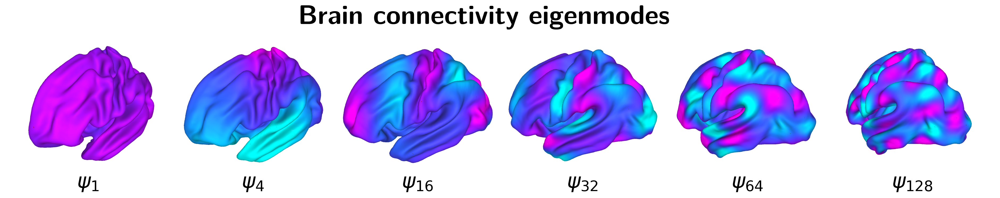

In [72]:
%%time
%config InlineBackend.figure_format = 'retina'

mpl.rcParams['font.family'] = 'Latin Modern Sans'
fig = plt.figure(layout="constrained", figsize=(24, 4))
fig.tight_layout(h_pad=0)
fig.suptitle("Brain connectivity eigenmodes", fontsize=36, x=0.5, y=0.92, weight='bold', ha="center", zorder=30)

desired_eigenmodes = ['Our connectome']
gs = GridSpec(len(desired_eigenmodes), 6, figure=fig, width_ratios=[1]*6, wspace=0.0, hspace=0.3, top=0.85)  # left=0.2, bottom=0.2, right=0.8, top=0.8, 

eigs = [0, 3, 15, 31, 63, 127]
for i, eigenmode in enumerate(desired_eigenmodes):
    for j in range(6):
        ax = fig.add_subplot(gs[i, j], zorder=20)

        eig = eigs[j]
        
        dx = -100
        view = ((-300, (-2.5 * dx) + (dx * j), 100), None, None, None)

        signal = eigenmodes[eigenmode].T[eig]
        plot_left_surface_with_cerebro(
            signal,
            ax,
            view=view, clims=(-0.01,0.01), colormap=plt.cm.cool
        )

        ax.text(0.5, .02, f'$\psi_{{{1 + eig}}}$', ha='center', va='top', transform=ax.transAxes, fontsize=28)
